In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import os

In [2]:
def get_matching_columns(gps_mpu_left,gps_mpu_right,left_key,right_key):
    matching_columns = []

    gps_mpu_merged = pd.merge(
        gps_mpu_left, gps_mpu_right,
        left_on=left_key, right_on=right_key, how='inner'
    )

    gps_mpu_merged['timestamp_match'] = gps_mpu_merged[left_key] == gps_mpu_merged[right_key]
    matching_count = gps_mpu_merged['timestamp_match'].sum()
    
    if matching_count == len(gps_mpu_merged):
        #gps_mpu_merged['timestamp_match'] = gps_mpu_PV2[left_key]
        #gps_mpu_merged.drop(columns=[left_key,right_key],inplace = True)
        for col in gps_mpu_merged.columns:
            if col.endswith('_left') and col.replace('_left', '_right') in gps_mpu_merged.columns:
                left_col = col
                right_col = col.replace('_left', '_right')

                if (gps_mpu_merged[left_col] == gps_mpu_merged[right_col]).all():
                    matching_columns.append(col.replace('_left', ''))

    return matching_columns,gps_mpu_merged

In [3]:
def Correc_Datos(df_original,df_config):
    for axis in ['x','y','z']:
        df_original[f'gyro_{axis}_dashboard_right'] = (df_original[f'gyro_{axis}_dashboard_right'] + df_config[f'gyroscope_bias_{axis}_right'].values[0])
        df_original[f'gyro_{axis}_dashboard_left'] = (df_original[f'gyro_{axis}_dashboard_left'] + df_config[f'gyroscope_bias_{axis}_left'].values[0])
        df_original[f'gyro_{axis}_above_suspension_left'] = (df_original[f'gyro_{axis}_above_suspension_left'] + df_config[f'gyroscope_bias_{axis}_left'].values[1])
        df_original[f'gyro_{axis}_above_suspension_right'] = (df_original[f'gyro_{axis}_above_suspension_right'] + df_config[f'gyroscope_bias_{axis}_right'].values[1])
        df_original[f'gyro_{axis}_below_suspension_left'] = (df_original[f'gyro_{axis}_below_suspension_left'] + df_config[f'gyroscope_bias_{axis}_left'].values[2])
        df_original[f'gyro_{axis}_below_suspension_right'] = (df_original[f'gyro_{axis}_below_suspension_right'] + df_config[f'gyroscope_bias_{axis}_right'].values[2])
        df_original[f'acc_{axis}_dashboard_right'] = (df_original[f'acc_{axis}_dashboard_right'] + df_config[f'accelerometer_bias_{axis}_right'].values[0])
        df_original[f'acc_{axis}_dashboard_left'] = (df_original[f'acc_{axis}_dashboard_left'] + df_config[f'accelerometer_bias_{axis}_left'].values[0])
        df_original[f'acc_{axis}_above_suspension_left'] = (df_original[f'acc_{axis}_above_suspension_left'] + df_config[f'accelerometer_bias_{axis}_left'].values[1])
        df_original[f'acc_{axis}_above_suspension_right'] = (df_original[f'acc_{axis}_above_suspension_right'] + df_config[f'accelerometer_bias_{axis}_right'].values[1])
        df_original[f'acc_{axis}_below_suspension_left'] = (df_original[f'acc_{axis}_below_suspension_left'] + df_config[f'accelerometer_bias_{axis}_left'].values[2])
        df_original[f'acc_{axis}_below_suspension_right'] = (df_original[f'acc_{axis}_below_suspension_right'] + df_config[f'accelerometer_bias_{axis}_right'].values[2])

    return df_original



In [4]:
def Calcular_Vel_Ang(df):
    prefixes = [
    'dashboard_left', 'dashboard_right',
    'above_suspension_left', 'above_suspension_right',
    'below_suspension_left', 'below_suspension_right'
    ]
    sum_x = np.zeros(len(df))
    sum_y = np.zeros(len(df))
    sum_z = np.zeros(len(df))
    
    for prefix in prefixes:
        x_col = f'gyro_x_{prefix}'
        y_col = f'gyro_y_{prefix}'
        z_col = f'gyro_z_{prefix}'
        
        if x_col in df.columns and y_col in df.columns and z_col in df.columns:
            sum_x += df[x_col]
            sum_y += df[y_col]
            sum_z += df[z_col]
    
    
    num_prefijos = len(prefixes)
    df['gyro_x_avg'] = sum_x / num_prefijos
    df['gyro_y_avg'] = sum_y / num_prefijos
    df['gyro_z_avg'] = sum_z / num_prefijos
    
    df['gyro_magnitude_avg'] = np.sqrt(df['gyro_x_avg']**2 + df['gyro_y_avg']**2 + df['gyro_z_avg']**2)
    
    return df
    

In [5]:
def Calcular_Acel(df):
    prefixes = [
    'dashboard_left', 'dashboard_right',
    'above_suspension_left', 'above_suspension_right',
    'below_suspension_left', 'below_suspension_right'
    ]
    sum_x = np.zeros(len(df))
    sum_y = np.zeros(len(df))
    sum_z = np.zeros(len(df))

    for prefix in prefixes:
        x_col = f'acc_x_{prefix}'
        y_col = f'acc_y_{prefix}'
        z_col = f'acc_z_{prefix}'
        
        if x_col in df.columns and y_col in df.columns and z_col in df.columns:
            sum_x += df[x_col]
            sum_y += df[y_col]
            sum_z += df[z_col]
    
    
    num_prefijos = len(prefixes)
    df['acc_x_avg'] = sum_x / num_prefijos
    df['acc_y_avg'] = sum_y / num_prefijos
    df['acc_z_avg'] = sum_z / num_prefijos
    
    # Calcular la magnitud de la aceleración promedio
    df['acc_magnitude_avg'] = np.sqrt(df['acc_x_avg']**2 + df['acc_y_avg']**2 + df['acc_z_avg']**2)
    
    return df

In [6]:
df = pd.read_csv('PVS 1/dataset_gps_mpu_left.csv')

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144036 entries, 0 to 144035
Data columns (total 32 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   timestamp                144036 non-null  float64
 1   acc_x_dashboard          144036 non-null  float64
 2   acc_y_dashboard          144036 non-null  float64
 3   acc_z_dashboard          144036 non-null  float64
 4   acc_x_above_suspension   144036 non-null  float64
 5   acc_y_above_suspension   144036 non-null  float64
 6   acc_z_above_suspension   144036 non-null  float64
 7   acc_x_below_suspension   144036 non-null  float64
 8   acc_y_below_suspension   144036 non-null  float64
 9   acc_z_below_suspension   144036 non-null  float64
 10  gyro_x_dashboard         144036 non-null  float64
 11  gyro_y_dashboard         144036 non-null  float64
 12  gyro_z_dashboard         144036 non-null  float64
 13  gyro_x_above_suspension  144036 non-null  float64
 14  gyro

PV1

In [8]:
gps = pd.read_csv('PVS 1/dataset_gps.csv')
gps_mpu_left = pd.read_csv('PVS 1/dataset_gps_mpu_left.csv')
gps_mpu_right = pd.read_csv('PVS 1/dataset_gps_mpu_right.csv')

In [9]:
gps_mpu_left.columns = [col+'_left' for col in gps_mpu_left.columns]
gps_mpu_right.columns = [col+'_right' for col in gps_mpu_right.columns]

In [10]:
gps_mpu_left.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144036 entries, 0 to 144035
Data columns (total 32 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   timestamp_left                144036 non-null  float64
 1   acc_x_dashboard_left          144036 non-null  float64
 2   acc_y_dashboard_left          144036 non-null  float64
 3   acc_z_dashboard_left          144036 non-null  float64
 4   acc_x_above_suspension_left   144036 non-null  float64
 5   acc_y_above_suspension_left   144036 non-null  float64
 6   acc_z_above_suspension_left   144036 non-null  float64
 7   acc_x_below_suspension_left   144036 non-null  float64
 8   acc_y_below_suspension_left   144036 non-null  float64
 9   acc_z_below_suspension_left   144036 non-null  float64
 10  gyro_x_dashboard_left         144036 non-null  float64
 11  gyro_y_dashboard_left         144036 non-null  float64
 12  gyro_z_dashboard_left         144036 non-nul

In [11]:
gps_mpu_right.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144036 entries, 0 to 144035
Data columns (total 32 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   timestamp_right                144036 non-null  float64
 1   acc_x_dashboard_right          144036 non-null  float64
 2   acc_y_dashboard_right          144036 non-null  float64
 3   acc_z_dashboard_right          144036 non-null  float64
 4   acc_x_above_suspension_right   144036 non-null  float64
 5   acc_y_above_suspension_right   144036 non-null  float64
 6   acc_z_above_suspension_right   144036 non-null  float64
 7   acc_x_below_suspension_right   144036 non-null  float64
 8   acc_y_below_suspension_right   144036 non-null  float64
 9   acc_z_below_suspension_right   144036 non-null  float64
 10  gyro_x_dashboard_right         144036 non-null  float64
 11  gyro_y_dashboard_right         144036 non-null  float64
 12  gyro_z_dashboard_right        

In [12]:
gps_mpu = pd.merge(gps_mpu_left,gps_mpu_right,left_on='timestamp_left', right_on='timestamp_right', how='inner')#Combinamos los dataframe
                                                                                                 # pero conservando las caracteristicas

In [13]:
gps_mpu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144036 entries, 0 to 144035
Data columns (total 64 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   timestamp_left                 144036 non-null  float64
 1   acc_x_dashboard_left           144036 non-null  float64
 2   acc_y_dashboard_left           144036 non-null  float64
 3   acc_z_dashboard_left           144036 non-null  float64
 4   acc_x_above_suspension_left    144036 non-null  float64
 5   acc_y_above_suspension_left    144036 non-null  float64
 6   acc_z_above_suspension_left    144036 non-null  float64
 7   acc_x_below_suspension_left    144036 non-null  float64
 8   acc_y_below_suspension_left    144036 non-null  float64
 9   acc_z_below_suspension_left    144036 non-null  float64
 10  gyro_x_dashboard_left          144036 non-null  float64
 11  gyro_y_dashboard_left          144036 non-null  float64
 12  gyro_z_dashboard_left         

In [14]:
gps_mpu['timestamp'] = gps_mpu['timestamp_left'] == gps_mpu['timestamp_right']

In [15]:
matching_count = gps_mpu['timestamp'].sum()

In [16]:
matching_count #Podemos ver que los timestamp coinciden por lo que podemos dejar un solo timestamo

144036

In [17]:
gps_mpu['timestamp'] = gps_mpu['timestamp_left']

In [18]:
gps_mpu.drop(columns=['timestamp_left','timestamp_right'],inplace = True)

In [19]:
gps_mpu

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,mag_y_above_suspension_right,mag_z_above_suspension_right,temp_dashboard_right,temp_above_suspension_right,temp_below_suspension_right,timestamp_gps_right,latitude_right,longitude_right,speed_right,timestamp
0,0.365116,0.167893,9.793961,0.327626,0.172733,9.781861,0.024797,0.172611,9.793824,-0.133896,...,14.911350,-14.487265,34.274628,34.035014,31.926408,1.577219e+09,-27.717841,-51.098865,0.009128,1.577219e+09
1,0.392649,0.176273,9.771216,0.381496,0.189492,9.699261,0.024797,0.194158,9.842905,-0.027084,...,13.572675,-13.254307,34.346512,33.891245,31.926408,1.577219e+09,-27.717841,-51.098865,0.009128,1.577219e+09
2,0.409408,0.181062,9.732909,0.283333,0.182310,9.807000,0.003249,0.227677,9.888395,0.125504,...,13.498305,-12.637827,34.370474,34.274628,31.543026,1.577219e+09,-27.717841,-51.098865,0.009128,1.577219e+09
3,0.371101,0.164302,9.749668,0.314458,0.230194,9.739963,0.005643,0.172611,9.871635,-0.088120,...,13.498305,-12.637827,34.370474,33.939168,31.926408,1.577219e+09,-27.717841,-51.098865,0.009128,1.577219e+09
4,0.390255,0.159514,9.869378,0.344385,0.202660,9.762708,0.005643,0.200144,9.860862,-0.179672,...,14.688238,-15.103745,34.370474,33.939168,30.967952,1.577219e+09,-27.717841,-51.098865,0.009128,1.577219e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144031,-0.527921,-0.322918,9.583271,-0.331976,-0.185200,9.528076,-0.704237,-0.054839,9.753122,-0.332260,...,-0.818079,-80.758798,32.884865,40.552520,33.244287,1.577220e+09,-27.717777,-51.099070,0.005715,1.577220e+09
144032,-0.663194,-0.575506,9.433633,-0.458869,-0.413847,10.223591,-0.748530,-0.212856,9.526870,-0.240707,...,-0.557781,-82.299997,32.884865,40.504598,33.172402,1.577220e+09,-27.717777,-51.099070,0.005715,1.577220e+09
144033,-0.375890,-0.245106,9.957964,-0.104527,-0.047534,9.687290,-0.719800,-0.150607,9.933885,0.064468,...,-2.565793,-84.149435,32.836943,40.600443,33.316171,1.577220e+09,-27.717777,-51.099070,0.005715,1.577220e+09
144034,-0.385466,-0.091877,9.840648,-0.530695,-0.452154,8.940299,-0.705434,-0.378056,10.003317,-0.423813,...,-2.008012,-79.525840,32.980711,40.600443,33.100518,1.577220e+09,-27.717777,-51.099070,0.005715,1.577220e+09


In [20]:
gps_mpu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144036 entries, 0 to 144035
Data columns (total 63 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   acc_x_dashboard_left           144036 non-null  float64
 1   acc_y_dashboard_left           144036 non-null  float64
 2   acc_z_dashboard_left           144036 non-null  float64
 3   acc_x_above_suspension_left    144036 non-null  float64
 4   acc_y_above_suspension_left    144036 non-null  float64
 5   acc_z_above_suspension_left    144036 non-null  float64
 6   acc_x_below_suspension_left    144036 non-null  float64
 7   acc_y_below_suspension_left    144036 non-null  float64
 8   acc_z_below_suspension_left    144036 non-null  float64
 9   gyro_x_dashboard_left          144036 non-null  float64
 10  gyro_y_dashboard_left          144036 non-null  float64
 11  gyro_z_dashboard_left          144036 non-null  float64
 12  gyro_x_above_suspension_left  

In [21]:
matching_columns = []

for col in gps_mpu.columns:
    if col.endswith('_left') and col.replace('_left', '_right') in gps_mpu.columns:
        left_col = col
        right_col = col.replace('_left','_right')

        if (gps_mpu[left_col] == gps_mpu[right_col]).all():
            matching_columns.append(col.replace('_left', ''))

In [22]:
matching_columns # Las columnas que coinciden son:

['timestamp_gps', 'latitude', 'longitude', 'speed']

In [23]:
gps_mpu['timestamp_gps'] = gps_mpu['timestamp_gps_left']
gps_mpu['latitude'] = gps_mpu['latitude_left']
gps_mpu['longitude'] = gps_mpu['longitude_left']
gps_mpu['speed'] = gps_mpu['speed_left']

In [24]:
gps_mpu.drop(columns=['timestamp_gps_left','timestamp_gps_right','latitude_left','latitude_right','longitude_left','longitude_right','speed_left','speed_right'],inplace = True)

In [25]:
gps_mpu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144036 entries, 0 to 144035
Data columns (total 59 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   acc_x_dashboard_left           144036 non-null  float64
 1   acc_y_dashboard_left           144036 non-null  float64
 2   acc_z_dashboard_left           144036 non-null  float64
 3   acc_x_above_suspension_left    144036 non-null  float64
 4   acc_y_above_suspension_left    144036 non-null  float64
 5   acc_z_above_suspension_left    144036 non-null  float64
 6   acc_x_below_suspension_left    144036 non-null  float64
 7   acc_y_below_suspension_left    144036 non-null  float64
 8   acc_z_below_suspension_left    144036 non-null  float64
 9   gyro_x_dashboard_left          144036 non-null  float64
 10  gyro_y_dashboard_left          144036 non-null  float64
 11  gyro_z_dashboard_left          144036 non-null  float64
 12  gyro_x_above_suspension_left  

In [26]:
gps_mpu

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,mag_y_above_suspension_right,mag_z_above_suspension_right,temp_dashboard_right,temp_above_suspension_right,temp_below_suspension_right,timestamp,timestamp_gps,latitude,longitude,speed
0,0.365116,0.167893,9.793961,0.327626,0.172733,9.781861,0.024797,0.172611,9.793824,-0.133896,...,14.911350,-14.487265,34.274628,34.035014,31.926408,1.577219e+09,1.577219e+09,-27.717841,-51.098865,0.009128
1,0.392649,0.176273,9.771216,0.381496,0.189492,9.699261,0.024797,0.194158,9.842905,-0.027084,...,13.572675,-13.254307,34.346512,33.891245,31.926408,1.577219e+09,1.577219e+09,-27.717841,-51.098865,0.009128
2,0.409408,0.181062,9.732909,0.283333,0.182310,9.807000,0.003249,0.227677,9.888395,0.125504,...,13.498305,-12.637827,34.370474,34.274628,31.543026,1.577219e+09,1.577219e+09,-27.717841,-51.098865,0.009128
3,0.371101,0.164302,9.749668,0.314458,0.230194,9.739963,0.005643,0.172611,9.871635,-0.088120,...,13.498305,-12.637827,34.370474,33.939168,31.926408,1.577219e+09,1.577219e+09,-27.717841,-51.098865,0.009128
4,0.390255,0.159514,9.869378,0.344385,0.202660,9.762708,0.005643,0.200144,9.860862,-0.179672,...,14.688238,-15.103745,34.370474,33.939168,30.967952,1.577219e+09,1.577219e+09,-27.717841,-51.098865,0.009128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144031,-0.527921,-0.322918,9.583271,-0.331976,-0.185200,9.528076,-0.704237,-0.054839,9.753122,-0.332260,...,-0.818079,-80.758798,32.884865,40.552520,33.244287,1.577220e+09,1.577220e+09,-27.717777,-51.099070,0.005715
144032,-0.663194,-0.575506,9.433633,-0.458869,-0.413847,10.223591,-0.748530,-0.212856,9.526870,-0.240707,...,-0.557781,-82.299997,32.884865,40.504598,33.172402,1.577220e+09,1.577220e+09,-27.717777,-51.099070,0.005715
144033,-0.375890,-0.245106,9.957964,-0.104527,-0.047534,9.687290,-0.719800,-0.150607,9.933885,0.064468,...,-2.565793,-84.149435,32.836943,40.600443,33.316171,1.577220e+09,1.577220e+09,-27.717777,-51.099070,0.005715
144034,-0.385466,-0.091877,9.840648,-0.530695,-0.452154,8.940299,-0.705434,-0.378056,10.003317,-0.423813,...,-2.008012,-79.525840,32.980711,40.600443,33.100518,1.577220e+09,1.577220e+09,-27.717777,-51.099070,0.005715


In [27]:
mpu_left = pd.read_csv('PVS 1/dataset_mpu_left.csv')
mpu_right = pd.read_csv('PVS 1/dataset_mpu_right.csv')

In [28]:
mpu_left.columns = [col+'_left' for col in mpu_left.columns]
mpu_right.columns = [col+'_right' for col in mpu_right.columns]

In [29]:
mpu_right

,timestamp_right,acc_x_dashboard_right,acc_y_dashboard_right,acc_z_dashboard_right,acc_x_above_suspension_right,acc_y_above_suspension_right,acc_z_above_suspension_right,acc_x_below_suspension_right,acc_y_below_suspension_right,acc_z_below_suspension_right,...,gyro_z_below_suspension_right,mag_x_dashboard_right,mag_y_dashboard_right,mag_z_dashboard_right,mag_x_above_suspension_right,mag_y_above_suspension_right,mag_z_above_suspension_right,temp_dashboard_right,temp_above_suspension_right,temp_below_suspension_right
0,1.577219e+09,0.314897,0.187227,9.863572,0.314750,0.166426,9.808869,0.529819,0.097111,9.930623,...,0.000186,21.269188,-5.267097,1.003341,119.994669,14.911350,-14.487265,34.274628,34.035014,31.926408
1,1.577219e+09,0.316094,0.175256,9.846813,0.343480,0.135302,9.854359,0.522637,0.097111,9.923440,...,-0.121884,21.352596,-4.596739,2.257518,119.994669,13.572675,-13.254307,34.346512,33.891245,31.926408
2,1.577219e+09,0.278984,0.199198,9.892303,0.283625,0.173609,9.856753,0.527425,0.104294,9.973719,...,0.030704,19.934650,-6.416282,2.006683,117.292086,13.498305,-12.637827,34.370474,34.274628,31.543026
3,1.577219e+09,0.295744,0.194409,9.806111,0.336298,0.161638,9.878301,0.517848,0.099505,9.901893,...,-0.182919,20.268285,-5.650159,1.672236,117.292086,13.498305,-12.637827,34.370474,33.939168,31.926408
4,1.577219e+09,0.322080,0.203986,9.877937,0.329115,0.156849,9.784927,0.548973,0.085140,9.873162,...,-0.182919,21.102371,-6.224751,2.173907,115.130020,14.688238,-15.103745,34.370474,33.939168,30.967952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144031,1.577220e+09,-0.515891,-0.204225,9.743862,-0.634551,-0.321991,9.605362,-0.532009,-0.129141,9.640925,...,0.229068,-10.342664,-24.132882,3.595307,-20.269370,-0.818079,-80.758798,32.884865,40.552520,33.244287
144032,1.577220e+09,-0.568563,-0.526246,9.408674,-0.523221,-0.068206,10.021953,-0.605032,-0.384123,9.858797,...,-0.274472,-9.258352,-24.994771,3.846142,-23.782727,-0.557781,-82.299997,32.884865,40.504598,33.172402
144033,1.577220e+09,-0.530256,-0.222182,9.858784,-0.506461,-0.130455,9.873512,-0.595455,-0.273990,9.545156,...,-0.427060,-9.091535,-24.037117,4.013366,-17.837045,-2.565793,-84.149435,32.836943,40.600443,33.316171
144034,1.577220e+09,-0.532650,-0.076136,10.052714,-0.469351,-0.416562,9.494031,-0.502082,-0.039358,9.594238,...,0.106998,-9.091535,-24.037117,4.013366,-19.188337,-2.008012,-79.525840,32.980711,40.600443,33.100518


In [30]:
mpu_left

,timestamp_left,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,...,gyro_z_below_suspension_left,mag_x_dashboard_left,mag_y_dashboard_left,mag_z_dashboard_left,mag_x_above_suspension_left,mag_y_above_suspension_left,mag_z_above_suspension_left,temp_dashboard_left,temp_above_suspension_left,temp_below_suspension_left
0,1.577219e+09,0.365116,0.167893,9.793961,0.327626,0.172733,9.781861,0.024797,0.172611,9.793824,...,-0.078110,22.878922,-6.040509,1.767874,75.340967,-7.537556,-0.334800,35.065355,33.340132,31.782640
1,1.577219e+09,0.392649,0.176273,9.771216,0.381496,0.189492,9.699261,0.024797,0.194158,9.842905,...,0.150771,22.878922,-5.854647,2.089306,75.300243,-6.469241,-5.222873,34.993471,33.172402,31.782640
2,1.577219e+09,0.409408,0.181062,9.732909,0.283333,0.182310,9.807000,0.003249,0.227677,9.888395,...,0.028701,23.434686,-4.181891,0.642863,75.463140,-7.893661,-4.687194,34.993471,33.412017,31.926408
3,1.577219e+09,0.371101,0.164302,9.749668,0.314458,0.230194,9.739963,0.005643,0.172611,9.871635,...,0.059219,23.990449,-5.482924,1.125011,75.463140,-7.893661,-4.687194,34.969509,33.220325,31.926408
4,1.577219e+09,0.390255,0.159514,9.869378,0.344385,0.202660,9.762708,0.005643,0.200144,9.860862,...,0.013442,22.693668,-6.040509,1.928590,74.933726,-8.012363,-4.084555,34.945548,33.220325,31.830563
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144031,1.577220e+09,-0.527921,-0.322918,9.583271,-0.331976,-0.185200,9.528076,-0.704237,-0.054839,9.753122,...,-0.001817,-9.911112,-24.626692,3.375032,74.200691,-42.673250,-16.673019,33.699554,35.568545,32.237907
144032,1.577220e+09,-0.663194,-0.575506,9.433633,-0.458869,-0.413847,10.223591,-0.748530,-0.212856,9.526870,...,0.181289,-9.170094,-23.883244,4.178611,74.648657,-42.554548,-20.489734,33.699554,35.472699,32.309791
144033,1.577220e+09,-0.375890,-0.245106,9.957964,-0.104527,-0.047534,9.687290,-0.719800,-0.150607,9.933885,...,0.089736,-9.170094,-23.883244,4.178611,73.997070,-39.705708,-18.347017,33.555785,35.472699,32.070177
144034,1.577220e+09,-0.385466,-0.091877,9.840648,-0.530695,-0.452154,8.940299,-0.705434,-0.378056,10.003317,...,-0.001817,-7.688059,-23.139797,5.785769,73.997070,-39.705708,-17.007819,33.699554,35.520622,32.261868


In [31]:
mpu = pd.merge(mpu_left,mpu_right,left_on='timestamp_left', right_on='timestamp_right', how='inner')

In [32]:
mpu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144036 entries, 0 to 144035
Data columns (total 56 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   timestamp_left                 144036 non-null  float64
 1   acc_x_dashboard_left           144036 non-null  float64
 2   acc_y_dashboard_left           144036 non-null  float64
 3   acc_z_dashboard_left           144036 non-null  float64
 4   acc_x_above_suspension_left    144036 non-null  float64
 5   acc_y_above_suspension_left    144036 non-null  float64
 6   acc_z_above_suspension_left    144036 non-null  float64
 7   acc_x_below_suspension_left    144036 non-null  float64
 8   acc_y_below_suspension_left    144036 non-null  float64
 9   acc_z_below_suspension_left    144036 non-null  float64
 10  gyro_x_dashboard_left          144036 non-null  float64
 11  gyro_y_dashboard_left          144036 non-null  float64
 12  gyro_z_dashboard_left         

In [33]:
matching_columns = []

for col in mpu.columns:
    if col.endswith('_left') and col.replace('_left', '_right') in mpu.columns:
        left_col = col
        right_col = col.replace('_left','_right')

        if (mpu[left_col] == mpu[right_col]).all():
            matching_columns.append(col.replace('_left', ''))

In [34]:
matching_columns

['timestamp']

In [35]:
mpu['timestamp'] = mpu['timestamp_left']== mpu['timestamp_right'] #Coinciden los timestamp

In [36]:
matching_count = mpu['timestamp'].sum()

In [37]:
matching_count

144036

In [38]:
mpu['timestamp'] = mpu['timestamp_left']

In [39]:
mpu.drop(columns=['timestamp_left','timestamp_right'],inplace = True)

In [40]:
mpu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144036 entries, 0 to 144035
Data columns (total 55 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   acc_x_dashboard_left           144036 non-null  float64
 1   acc_y_dashboard_left           144036 non-null  float64
 2   acc_z_dashboard_left           144036 non-null  float64
 3   acc_x_above_suspension_left    144036 non-null  float64
 4   acc_y_above_suspension_left    144036 non-null  float64
 5   acc_z_above_suspension_left    144036 non-null  float64
 6   acc_x_below_suspension_left    144036 non-null  float64
 7   acc_y_below_suspension_left    144036 non-null  float64
 8   acc_z_below_suspension_left    144036 non-null  float64
 9   gyro_x_dashboard_left          144036 non-null  float64
 10  gyro_y_dashboard_left          144036 non-null  float64
 11  gyro_z_dashboard_left          144036 non-null  float64
 12  gyro_x_above_suspension_left  

In [41]:
mpu

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,mag_x_dashboard_right,mag_y_dashboard_right,mag_z_dashboard_right,mag_x_above_suspension_right,mag_y_above_suspension_right,mag_z_above_suspension_right,temp_dashboard_right,temp_above_suspension_right,temp_below_suspension_right,timestamp
0,0.365116,0.167893,9.793961,0.327626,0.172733,9.781861,0.024797,0.172611,9.793824,-0.133896,...,21.269188,-5.267097,1.003341,119.994669,14.911350,-14.487265,34.274628,34.035014,31.926408,1.577219e+09
1,0.392649,0.176273,9.771216,0.381496,0.189492,9.699261,0.024797,0.194158,9.842905,-0.027084,...,21.352596,-4.596739,2.257518,119.994669,13.572675,-13.254307,34.346512,33.891245,31.926408,1.577219e+09
2,0.409408,0.181062,9.732909,0.283333,0.182310,9.807000,0.003249,0.227677,9.888395,0.125504,...,19.934650,-6.416282,2.006683,117.292086,13.498305,-12.637827,34.370474,34.274628,31.543026,1.577219e+09
3,0.371101,0.164302,9.749668,0.314458,0.230194,9.739963,0.005643,0.172611,9.871635,-0.088120,...,20.268285,-5.650159,1.672236,117.292086,13.498305,-12.637827,34.370474,33.939168,31.926408,1.577219e+09
4,0.390255,0.159514,9.869378,0.344385,0.202660,9.762708,0.005643,0.200144,9.860862,-0.179672,...,21.102371,-6.224751,2.173907,115.130020,14.688238,-15.103745,34.370474,33.939168,30.967952,1.577219e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144031,-0.527921,-0.322918,9.583271,-0.331976,-0.185200,9.528076,-0.704237,-0.054839,9.753122,-0.332260,...,-10.342664,-24.132882,3.595307,-20.269370,-0.818079,-80.758798,32.884865,40.552520,33.244287,1.577220e+09
144032,-0.663194,-0.575506,9.433633,-0.458869,-0.413847,10.223591,-0.748530,-0.212856,9.526870,-0.240707,...,-9.258352,-24.994771,3.846142,-23.782727,-0.557781,-82.299997,32.884865,40.504598,33.172402,1.577220e+09
144033,-0.375890,-0.245106,9.957964,-0.104527,-0.047534,9.687290,-0.719800,-0.150607,9.933885,0.064468,...,-9.091535,-24.037117,4.013366,-17.837045,-2.565793,-84.149435,32.836943,40.600443,33.316171,1.577220e+09
144034,-0.385466,-0.091877,9.840648,-0.530695,-0.452154,8.940299,-0.705434,-0.378056,10.003317,-0.423813,...,-9.091535,-24.037117,4.013366,-19.188337,-2.008012,-79.525840,32.980711,40.600443,33.100518,1.577220e+09


In [42]:
gps_mpu.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144036 entries, 0 to 144035
Data columns (total 59 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   acc_x_dashboard_left           144036 non-null  float64
 1   acc_y_dashboard_left           144036 non-null  float64
 2   acc_z_dashboard_left           144036 non-null  float64
 3   acc_x_above_suspension_left    144036 non-null  float64
 4   acc_y_above_suspension_left    144036 non-null  float64
 5   acc_z_above_suspension_left    144036 non-null  float64
 6   acc_x_below_suspension_left    144036 non-null  float64
 7   acc_y_below_suspension_left    144036 non-null  float64
 8   acc_z_below_suspension_left    144036 non-null  float64
 9   gyro_x_dashboard_left          144036 non-null  float64
 10  gyro_y_dashboard_left          144036 non-null  float64
 11  gyro_z_dashboard_left          144036 non-null  float64
 12  gyro_x_above_suspension_left  

In [43]:
matching_columns = [] # Podemos ver que los datos son iguales entre el dataset mpu y gps_mpu por lo que nos quedamos con el dataset 
                      # gps_mpu por las columnas extra que tiene
for col in gps_mpu.columns:
    if col in mpu.columns:
        if (gps_mpu[col] == mpu[col]).all():
            matching_columns.append(col)
            
        

In [44]:
matching_columns

['acc_x_dashboard_left',
 'acc_y_dashboard_left',
 'acc_z_dashboard_left',
 'acc_x_above_suspension_left',
 'acc_y_above_suspension_left',
 'acc_z_above_suspension_left',
 'acc_x_below_suspension_left',
 'acc_y_below_suspension_left',
 'acc_z_below_suspension_left',
 'gyro_x_dashboard_left',
 'gyro_y_dashboard_left',
 'gyro_z_dashboard_left',
 'gyro_x_above_suspension_left',
 'gyro_y_above_suspension_left',
 'gyro_z_above_suspension_left',
 'gyro_x_below_suspension_left',
 'gyro_y_below_suspension_left',
 'gyro_z_below_suspension_left',
 'mag_x_dashboard_left',
 'mag_y_dashboard_left',
 'mag_z_dashboard_left',
 'mag_x_above_suspension_left',
 'mag_y_above_suspension_left',
 'mag_z_above_suspension_left',
 'temp_dashboard_left',
 'temp_above_suspension_left',
 'temp_below_suspension_left',
 'acc_x_dashboard_right',
 'acc_y_dashboard_right',
 'acc_z_dashboard_right',
 'acc_x_above_suspension_right',
 'acc_y_above_suspension_right',
 'acc_z_above_suspension_right',
 'acc_x_below_suspensio

In [45]:
gps.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1467 entries, 0 to 1466
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   timestamp                1467 non-null   float64
 1   latitude                 1467 non-null   float64
 2   longitude                1467 non-null   float64
 3   elevation                1467 non-null   float64
 4   accuracy                 1467 non-null   float64
 5   bearing                  1458 non-null   float64
 6   speed_meters_per_second  1467 non-null   float64
 7   satellites               1467 non-null   int64  
 8   provider                 1467 non-null   object 
 9   hdop                     1467 non-null   float64
 10  vdop                     1467 non-null   float64
 11  pdop                     1467 non-null   float64
 12  geoidheight              1467 non-null   float64
 13  ageofdgpsdata            0 non-null      float64
 14  dgpsid                  

In [46]:
gps.shape

(1467, 20)

In [47]:
gps.head(20)

,timestamp,latitude,longitude,elevation,accuracy,bearing,speed_meters_per_second,satellites,provider,hdop,vdop,pdop,geoidheight,ageofdgpsdata,dgpsid,activity,battery,annotation,distance_meters,elapsed_time_seconds
0,1.577219e+09,-27.717812,-51.098895,948.770836,24.0,159.73294,0.053275,0,gps,0.8,1.7,1.9,3.6,NaN,NaN,NaN,87,NaN,0.000000,0.0
1,1.577219e+09,-27.717818,-51.098840,970.378820,12.0,NaN,0.000000,12,gps,0.8,1.5,1.7,3.6,NaN,NaN,NaN,87,NaN,5.442520,2.0
2,1.577219e+09,-27.717832,-51.098871,989.374267,4.0,NaN,0.000000,13,gps,0.8,1.6,1.8,3.6,NaN,NaN,NaN,86,NaN,3.404871,5.0
3,1.577219e+09,-27.717833,-51.098867,988.439139,4.0,NaN,0.000000,14,gps,0.8,1.7,1.9,3.6,NaN,NaN,NaN,86,NaN,0.421733,1.0
4,1.577219e+09,-27.717835,-51.098873,987.668730,4.0,NaN,0.000000,14,gps,0.8,1.6,1.8,3.6,NaN,NaN,NaN,86,NaN,0.574281,1.0
5,1.577219e+09,-27.717833,-51.098873,987.570233,4.0,NaN,0.000000,14,gps,0.8,1.6,1.8,3.6,NaN,NaN,NaN,86,NaN,0.236827,1.0
6,1.577219e+09,-27.717832,-51.098873,987.283553,4.0,NaN,0.000000,14,gps,0.8,1.7,1.9,3.6,NaN,NaN,NaN,86,NaN,0.050913,1.0
7,1.577219e+09,-27.717836,-51.098876,987.153838,4.0,NaN,0.000000,14,gps,0.8,1.6,1.8,3.6,NaN,NaN,NaN,86,NaN,0.498949,1.0
8,1.577219e+09,-27.717839,-51.098878,986.771461,4.0,NaN,0.000000,14,gps,0.8,1.6,1.8,3.6,NaN,NaN,NaN,86,NaN,0.364786,1.0
9,1.577219e+09,-27.717839,-51.098880,986.673182,4.0,NaN,0.000000,14,gps,0.8,1.7,1.9,3.6,NaN,NaN,NaN,86,NaN,0.129140,1.0


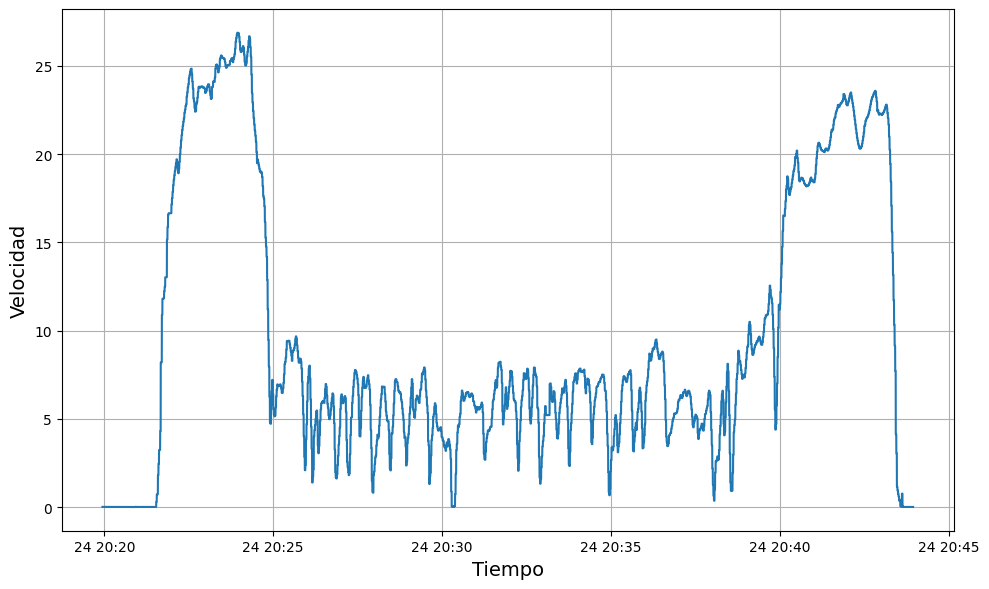

In [48]:
gps_mpu['timestamp'] = pd.to_datetime(gps_mpu['timestamp'],unit = 's') # Se graficaron los valores de speed del
plt.figure(figsize=(10,6))                                             # dataset gps que tiene menos datos con respecto  
plt.plot(gps_mpu['timestamp'],gps_mpu['speed'])                        # a los del dataset gps_mpu uy se puede ver que son iguales
plt.xlabel('Tiempo', fontsize=14)
plt.ylabel('Velocidad', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()

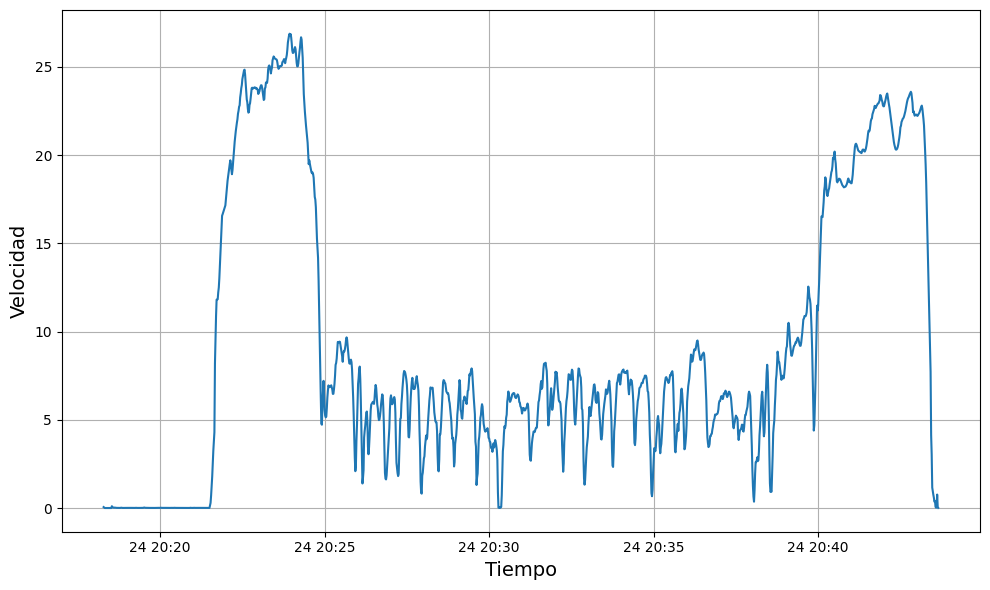

In [49]:
gps['timestamp'] = pd.to_datetime(gps['timestamp'],unit = 's')
plt.figure(figsize=(10,6))
plt.plot(gps['timestamp'],gps['speed_meters_per_second'])
plt.xlabel('Tiempo', fontsize=14)
plt.ylabel('Velocidad', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.show()

In [50]:
df_lbls = pd.read_csv('PVS 1/dataset_labels.csv')


In [51]:
df_lbls

,paved_road,unpaved_road,dirt_road,cobblestone_road,asphalt_road,no_speed_bump,speed_bump_asphalt,speed_bump_cobblestone,good_road_left,regular_road_left,bad_road_left,good_road_right,regular_road_right,bad_road_right
0,1,0,0,0,1,1,0,0,1,0,0,1,0,0
1,1,0,0,0,1,1,0,0,1,0,0,1,0,0
2,1,0,0,0,1,1,0,0,1,0,0,1,0,0
3,1,0,0,0,1,1,0,0,1,0,0,1,0,0
4,1,0,0,0,1,1,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144031,1,0,0,0,1,1,0,0,1,0,0,1,0,0
144032,1,0,0,0,1,1,0,0,1,0,0,1,0,0
144033,1,0,0,0,1,1,0,0,1,0,0,1,0,0
144034,1,0,0,0,1,1,0,0,1,0,0,1,0,0


In [52]:
df_PV1 = pd.concat([gps_mpu,df_lbls],axis = 1)

In [53]:
df_PV1

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,asphalt_road,no_speed_bump,speed_bump_asphalt,speed_bump_cobblestone,good_road_left,regular_road_left,bad_road_left,good_road_right,regular_road_right,bad_road_right
0,0.365116,0.167893,9.793961,0.327626,0.172733,9.781861,0.024797,0.172611,9.793824,-0.133896,...,1,1,0,0,1,0,0,1,0,0
1,0.392649,0.176273,9.771216,0.381496,0.189492,9.699261,0.024797,0.194158,9.842905,-0.027084,...,1,1,0,0,1,0,0,1,0,0
2,0.409408,0.181062,9.732909,0.283333,0.182310,9.807000,0.003249,0.227677,9.888395,0.125504,...,1,1,0,0,1,0,0,1,0,0
3,0.371101,0.164302,9.749668,0.314458,0.230194,9.739963,0.005643,0.172611,9.871635,-0.088120,...,1,1,0,0,1,0,0,1,0,0
4,0.390255,0.159514,9.869378,0.344385,0.202660,9.762708,0.005643,0.200144,9.860862,-0.179672,...,1,1,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144031,-0.527921,-0.322918,9.583271,-0.331976,-0.185200,9.528076,-0.704237,-0.054839,9.753122,-0.332260,...,1,1,0,0,1,0,0,1,0,0
144032,-0.663194,-0.575506,9.433633,-0.458869,-0.413847,10.223591,-0.748530,-0.212856,9.526870,-0.240707,...,1,1,0,0,1,0,0,1,0,0
144033,-0.375890,-0.245106,9.957964,-0.104527,-0.047534,9.687290,-0.719800,-0.150607,9.933885,0.064468,...,1,1,0,0,1,0,0,1,0,0
144034,-0.385466,-0.091877,9.840648,-0.530695,-0.452154,8.940299,-0.705434,-0.378056,10.003317,-0.423813,...,1,1,0,0,1,0,0,1,0,0


In [54]:
sttngs_PV1_right = pd.read_csv('PVS 1/dataset_settings_right.csv')

In [55]:
sttngs_PV1_right

,placement,address_mpu,address_ak,gyroscope_full_scale,accelerometer_full_scale,magnetometer_full_scale,gyroscope_resolution,accelerometer_resolution,magnetometer_resolution,gyroscope_bias_x,...,accelerometer_bias_z,magnetometer_factory_sensitivity_x,magnetometer_factory_sensitivity_y,magnetometer_factory_sensitivity_z,magnetometer_soft_iron_distortion_x,magnetometer_soft_iron_distortion_y,magnetometer_soft_iron_distortion_z,magnetometer_hard_iron_distortion_x,magnetometer_hard_iron_distortion_y,magnetometer_hard_iron_distortion_z
0,dashboard,0x69,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,0.847054,...,2.859215,1.175781,1.175781,1.140625,0.946237,1.08642,0.977778,9.960690,12.957712,-48.912897
1,above_suspension,0x68,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,0.288800,...,-0.425993,1.187500,1.187500,1.136719,3.035714,0.41769,3.617021,-37.747131,36.233684,37.070355
2,below_suspension,0x68,NaN,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,-1.099749,...,3.165660,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [56]:
sttngs_PV1_left = pd.read_csv('PVS 1/dataset_settings_left.csv')

In [57]:
sttngs_PV1_left

,placement,address_mpu,address_ak,gyroscope_full_scale,accelerometer_full_scale,magnetometer_full_scale,gyroscope_resolution,accelerometer_resolution,magnetometer_resolution,gyroscope_bias_x,...,accelerometer_bias_z,magnetometer_factory_sensitivity_x,magnetometer_factory_sensitivity_y,magnetometer_factory_sensitivity_z,magnetometer_soft_iron_distortion_x,magnetometer_soft_iron_distortion_y,magnetometer_soft_iron_distortion_z,magnetometer_hard_iron_distortion_x,magnetometer_hard_iron_distortion_y,magnetometer_hard_iron_distortion_z
0,dashboard,0x69,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,-0.064468,...,4.433583,1.191406,1.195312,1.148438,1.037037,1.037037,0.933333,-4.733912,12.993733,-53.725000
1,above_suspension,0x68,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,1.509504,...,0.016409,0.500000,1.187500,1.187500,1.086420,1.333333,0.752137,-68.110939,32.272016,29.734768
2,below_suspension,0x68,NaN,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,0.987825,...,-0.445664,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [58]:
sttngs_PV2_right = pd.read_csv('PVS 2/dataset_settings_right.csv')

In [59]:
sttngs_PV2_right

,placement,address_mpu,address_ak,gyroscope_full_scale,accelerometer_full_scale,magnetometer_full_scale,gyroscope_resolution,accelerometer_resolution,magnetometer_resolution,gyroscope_bias_x,...,accelerometer_bias_z,magnetometer_factory_sensitivity_x,magnetometer_factory_sensitivity_y,magnetometer_factory_sensitivity_z,magnetometer_soft_iron_distortion_x,magnetometer_soft_iron_distortion_y,magnetometer_soft_iron_distortion_z,magnetometer_hard_iron_distortion_x,magnetometer_hard_iron_distortion_y,magnetometer_hard_iron_distortion_z
0,dashboard,0x69,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,0.921631,...,2.774999,1.175781,1.175781,1.140625,1.049383,0.944444,1.011905,32.702798,6.346635,-46.005487
1,above_suspension,0x68,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,0.475069,...,-0.433993,1.187500,1.187500,1.136719,1.221532,0.500424,5.462963,-9.629770,34.987317,35.792067
2,below_suspension,0x68,NaN,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,-0.970931,...,3.005977,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [60]:
sttngs_PV2_left = pd.read_csv('PVS 2/dataset_settings_left.csv')

In [61]:
sttngs_PV2_left

,placement,address_mpu,address_ak,gyroscope_full_scale,accelerometer_full_scale,magnetometer_full_scale,gyroscope_resolution,accelerometer_resolution,magnetometer_resolution,gyroscope_bias_x,...,accelerometer_bias_z,magnetometer_factory_sensitivity_x,magnetometer_factory_sensitivity_y,magnetometer_factory_sensitivity_z,magnetometer_soft_iron_distortion_x,magnetometer_soft_iron_distortion_y,magnetometer_soft_iron_distortion_z,magnetometer_hard_iron_distortion_x,magnetometer_hard_iron_distortion_y,magnetometer_hard_iron_distortion_z
0,dashboard,0x69,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,-0.335693,...,4.308862,1.191406,1.195312,1.148438,0.977011,1.049383,0.977011,17.774501,5.645553,-51.572556
1,above_suspension,0x68,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,1.625247,...,0.089345,1.132812,1.132812,1.144531,2.583333,1.968254,0.475096,2.745757,3.566907,14.930054
2,below_suspension,0x68,NaN,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,1.034328,...,-0.398863,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [62]:
sttngs_PV3_right = pd.read_csv('PVS 3/dataset_settings_right.csv')

In [63]:
sttngs_PV3_right

,placement,address_mpu,address_ak,gyroscope_full_scale,accelerometer_full_scale,magnetometer_full_scale,gyroscope_resolution,accelerometer_resolution,magnetometer_resolution,gyroscope_bias_x,...,accelerometer_bias_z,magnetometer_factory_sensitivity_x,magnetometer_factory_sensitivity_y,magnetometer_factory_sensitivity_z,magnetometer_soft_iron_distortion_x,magnetometer_soft_iron_distortion_y,magnetometer_soft_iron_distortion_z,magnetometer_hard_iron_distortion_x,magnetometer_hard_iron_distortion_y,magnetometer_hard_iron_distortion_z
0,dashboard,0x69,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,0.971352,...,2.800282,1.175781,1.175781,1.140625,0.959596,1.130952,0.931373,32.702798,6.346635,-45.834463
1,above_suspension,0x68,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,0.604211,...,-0.396036,1.187500,1.195312,1.195312,0.461847,3.194444,1.916667,-9.714990,2.150687,37.995467
2,below_suspension,0x68,NaN,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,-1.006708,...,3.032928,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [64]:
sttngs_PV3_left = pd.read_csv('PVS 3/dataset_settings_left.csv')

In [65]:
sttngs_PV3_left

,placement,address_mpu,address_ak,gyroscope_full_scale,accelerometer_full_scale,magnetometer_full_scale,gyroscope_resolution,accelerometer_resolution,magnetometer_resolution,gyroscope_bias_x,...,accelerometer_bias_z,magnetometer_factory_sensitivity_x,magnetometer_factory_sensitivity_y,magnetometer_factory_sensitivity_z,magnetometer_soft_iron_distortion_x,magnetometer_soft_iron_distortion_y,magnetometer_soft_iron_distortion_z,magnetometer_hard_iron_distortion_x,magnetometer_hard_iron_distortion_y,magnetometer_hard_iron_distortion_z
0,dashboard,0x69,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,-0.441551,...,4.322611,1.191406,1.195312,1.148438,1.111111,0.919540,0.987654,17.685182,6.004001,-51.916947
1,above_suspension,0x68,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,1.537044,...,0.073928,1.132812,1.187500,1.144531,1.736111,1.157407,0.641026,2.038233,3.057349,27.543375
2,below_suspension,0x68,NaN,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,1.062121,...,-0.417788,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [66]:
sttngs_PV2_left.columns = [col+'_left' for col in sttngs_PV2_left.columns]
sttngs_PV2_right.columns = [col+'_right' for col in sttngs_PV2_right.columns]
sttngs_PV3_right.columns = [col+'_right' for col in sttngs_PV3_right.columns]
sttngs_PV3_left.columns = [col+'_left' for col in sttngs_PV3_left.columns]
sttngs_PV1_right.columns = [col+'_right' for col in sttngs_PV1_right.columns]
sttngs_PV1_left.columns = [col+'_left' for col in sttngs_PV1_left.columns]

In [67]:
df_sttngs_PV2 = pd.concat([sttngs_PV2_left,sttngs_PV2_right],axis = 1)
df_sttngs_PV1 = pd.concat([sttngs_PV1_left,sttngs_PV1_right],axis = 1)
df_sttngs_PV3 = pd.concat([sttngs_PV3_left,sttngs_PV3_right],axis = 1)

In [68]:
df_sttngs_PV3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 48 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   placement_left                             3 non-null      object 
 1   address_mpu_left                           3 non-null      object 
 2   address_ak_left                            2 non-null      object 
 3   gyroscope_full_scale_left                  3 non-null      object 
 4   accelerometer_full_scale_left              3 non-null      object 
 5   magnetometer_full_scale_left               3 non-null      object 
 6   gyroscope_resolution_left                  3 non-null      float64
 7   accelerometer_resolution_left              3 non-null      float64
 8   magnetometer_resolution_left               3 non-null      float64
 9   gyroscope_bias_x_left                      3 non-null      float64
 10  gyroscope_bias_y_left         

In [69]:
df_sttngs_PV3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 48 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   placement_left                             3 non-null      object 
 1   address_mpu_left                           3 non-null      object 
 2   address_ak_left                            2 non-null      object 
 3   gyroscope_full_scale_left                  3 non-null      object 
 4   accelerometer_full_scale_left              3 non-null      object 
 5   magnetometer_full_scale_left               3 non-null      object 
 6   gyroscope_resolution_left                  3 non-null      float64
 7   accelerometer_resolution_left              3 non-null      float64
 8   magnetometer_resolution_left               3 non-null      float64
 9   gyroscope_bias_x_left                      3 non-null      float64
 10  gyroscope_bias_y_left         

In [70]:
pd.set_option('display.max_rows', None) #Podemos ver que no hay valores nulos
df_PV1.isnull().sum()

acc_x_dashboard_left             0
acc_y_dashboard_left             0
acc_z_dashboard_left             0
acc_x_above_suspension_left      0
acc_y_above_suspension_left      0
acc_z_above_suspension_left      0
acc_x_below_suspension_left      0
acc_y_below_suspension_left      0
acc_z_below_suspension_left      0
gyro_x_dashboard_left            0
gyro_y_dashboard_left            0
gyro_z_dashboard_left            0
gyro_x_above_suspension_left     0
gyro_y_above_suspension_left     0
gyro_z_above_suspension_left     0
gyro_x_below_suspension_left     0
gyro_y_below_suspension_left     0
gyro_z_below_suspension_left     0
mag_x_dashboard_left             0
mag_y_dashboard_left             0
mag_z_dashboard_left             0
mag_x_above_suspension_left      0
mag_y_above_suspension_left      0
mag_z_above_suspension_left      0
temp_dashboard_left              0
temp_above_suspension_left       0
temp_below_suspension_left       0
acc_x_dashboard_right            0
acc_y_dashboard_righ

In [71]:
gps_PV2 = pd.read_csv('PVS 2/dataset_gps.csv')
gps_mpu_left_PV2 = pd.read_csv('PVS 2/dataset_gps_mpu_left.csv')
gps_mpu_right_PV2 = pd.read_csv('PVS 2/dataset_gps_mpu_right.csv')
gps_mpu_left_PV2.columns = [col+'_left' for col in gps_mpu_left_PV2.columns]
gps_mpu_right_PV2.columns = [col+'_right' for col in gps_mpu_right_PV2.columns]

In [72]:
pd.reset_option('display.max_rows')
gps_mpu_left_PV2

,timestamp_left,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,...,mag_x_above_suspension_left,mag_y_above_suspension_left,mag_z_above_suspension_left,temp_dashboard_left,temp_above_suspension_left,temp_below_suspension_left,timestamp_gps_left,latitude_left,longitude_left,speed_left
0,1.577221e+09,-0.029431,-0.019621,9.781015,0.024584,-0.025781,9.798708,0.026450,-0.026963,9.846382,...,-6.215633,4.163336e-16,-7.011675,32.166023,41.894360,35.640429,1.577221e+09,-27.717712,-51.099027,0.010822
1,1.577221e+09,-0.039008,0.009110,9.819322,-0.004146,-0.046132,9.798708,0.015676,0.012541,9.803287,...,-7.093206,4.346073e+00,-7.093206,32.453560,41.750592,35.424776,1.577221e+09,-27.717712,-51.099027,0.010822
2,1.577221e+09,0.010073,0.005518,9.777423,-0.031679,0.001752,9.822650,0.034830,-0.019781,9.776950,...,-7.093206,-1.002940e+00,-7.093206,32.405637,41.966244,35.951927,1.577221e+09,-27.717712,-51.099027,0.010822
3,1.577221e+09,0.020847,0.028263,9.785803,-0.037665,0.023300,9.793920,0.001311,0.012541,9.786527,...,-7.093206,-1.671566e+00,-7.093206,32.453560,41.942283,35.520622,1.577221e+09,-27.717712,-51.099027,0.010822
4,1.577221e+09,-0.003095,-0.017227,9.800168,0.048526,-0.003037,9.803497,0.025253,0.019724,9.767374,...,-6.215633,-1.671566e+00,5.951770,32.309791,41.990206,35.664390,1.577221e+09,-27.717712,-51.099027,0.010822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124679,1.577222e+09,0.427861,-0.261435,9.958185,0.207741,-0.319071,9.609566,0.275447,-0.418415,9.849974,...,-6.435026,5.014699e-01,6.074067,32.070177,34.777818,31.231527,1.577222e+09,-27.717741,-51.099118,0.023570
124680,1.577222e+09,0.466169,-0.316502,9.867206,0.113170,-0.508213,9.030170,0.223972,-0.614740,9.982852,...,-7.093206,3.677446e+00,6.114832,32.094138,34.562165,31.399257,1.577222e+09,-27.717741,-51.099118,0.023570
124681,1.577222e+09,0.332093,-0.555922,9.646939,0.309494,-0.309494,9.868140,0.238337,-0.099986,9.688365,...,-7.093206,3.677446e+00,6.604019,32.261868,34.945548,31.255489,1.577222e+09,-27.717741,-51.099118,0.023570
124682,1.577222e+09,0.339276,-0.570287,9.824110,0.548915,-0.369349,9.753218,0.247914,-0.710508,9.365148,...,-7.093206,3.677446e+00,6.114832,32.070177,34.897625,31.303412,1.577222e+09,-27.717741,-51.099118,0.023570


In [73]:
matching_columns,gps_mpu_PV2 = get_matching_columns(gps_mpu_left_PV2,gps_mpu_right_PV2,'timestamp_left','timestamp_right')

In [74]:
matching_columns

['timestamp', 'timestamp_gps', 'latitude', 'longitude', 'speed']

In [75]:
gps_mpu_PV2['timestamp'] = gps_mpu_PV2['timestamp_left']
gps_mpu_PV2['timestamp_gps'] = gps_mpu_PV2['timestamp_gps_left']
gps_mpu_PV2['latitude'] = gps_mpu_PV2['latitude_left']
gps_mpu_PV2['longitude'] = gps_mpu_PV2['longitude_left']
gps_mpu_PV2['speed'] = gps_mpu_PV2['speed_left']
gps_mpu_PV2.drop(columns=['timestamp_match','timestamp_right','timestamp_left','timestamp_gps_left','timestamp_gps_right','latitude_left','latitude_right','longitude_left','longitude_right','speed_left','speed_right'],inplace = True)

In [76]:
gps_mpu_PV2

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,mag_y_above_suspension_right,mag_z_above_suspension_right,temp_dashboard_right,temp_above_suspension_right,temp_below_suspension_right,timestamp,timestamp_gps,latitude,longitude,speed
0,-0.029431,-0.019621,9.781015,0.024584,-0.025781,9.798708,0.026450,-0.026963,9.846382,-0.122070,...,-16.617479,-7.448790,32.094138,46.686645,38.108455,1.577221e+09,1.577221e+09,-27.717712,-51.099027,0.010822
1,-0.039008,0.009110,9.819322,-0.004146,-0.046132,9.798708,0.015676,0.012541,9.803287,-0.030518,...,-16.795682,-5.586593,31.974331,46.590799,38.156378,1.577221e+09,1.577221e+09,-27.717712,-51.099027,0.010822
2,0.010073,0.005518,9.777423,-0.031679,0.001752,9.822650,0.034830,-0.019781,9.776950,-0.122070,...,-17.152089,-9.310988,31.926408,46.351185,38.395992,1.577221e+09,1.577221e+09,-27.717712,-51.099027,0.010822
3,0.020847,0.028263,9.785803,-0.037665,0.023300,9.793920,0.001311,0.012541,9.786527,0.061035,...,-16.617479,-13.035383,32.118100,46.494953,38.108455,1.577221e+09,1.577221e+09,-27.717712,-51.099027,0.010822
4,-0.003095,-0.017227,9.800168,0.048526,-0.003037,9.803497,0.025253,0.019724,9.767374,-0.091553,...,-16.617479,-1.862198,32.118100,46.494953,37.916764,1.577221e+09,1.577221e+09,-27.717712,-51.099027,0.010822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124679,0.427861,-0.261435,9.958185,0.207741,-0.319071,9.609566,0.275447,-0.418415,9.849974,0.030518,...,-0.044551,-195.530738,31.207566,39.450295,32.261868,1.577222e+09,1.577222e+09,-27.717741,-51.099118,0.023570
124680,0.466169,-0.316502,9.867206,0.113170,-0.508213,9.030170,0.223972,-0.614740,9.982852,-0.122070,...,-0.400958,-135.940418,31.303412,39.737832,32.261868,1.577222e+09,1.577222e+09,-27.717741,-51.099118,0.023570
124681,0.332093,-0.555922,9.646939,0.309494,-0.309494,9.868140,0.238337,-0.099986,9.688365,-0.183105,...,-2.361197,-134.078220,31.279450,39.498218,32.309791,1.577222e+09,1.577222e+09,-27.717741,-51.099118,0.023570
124682,0.339276,-0.570287,9.824110,0.548915,-0.369349,9.753218,0.247914,-0.710508,9.365148,-0.122070,...,-1.202874,-164.804479,31.255489,39.689909,32.189984,1.577222e+09,1.577222e+09,-27.717741,-51.099118,0.023570


In [77]:
gps_mpu_PV2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124684 entries, 0 to 124683
Data columns (total 59 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   acc_x_dashboard_left           124684 non-null  float64
 1   acc_y_dashboard_left           124684 non-null  float64
 2   acc_z_dashboard_left           124684 non-null  float64
 3   acc_x_above_suspension_left    124684 non-null  float64
 4   acc_y_above_suspension_left    124684 non-null  float64
 5   acc_z_above_suspension_left    124684 non-null  float64
 6   acc_x_below_suspension_left    124684 non-null  float64
 7   acc_y_below_suspension_left    124684 non-null  float64
 8   acc_z_below_suspension_left    124684 non-null  float64
 9   gyro_x_dashboard_left          124684 non-null  float64
 10  gyro_y_dashboard_left          124684 non-null  float64
 11  gyro_z_dashboard_left          124684 non-null  float64
 12  gyro_x_above_suspension_left  

In [78]:
df_lbls_PV2 = pd.read_csv('PVS 2/dataset_labels.csv')

In [79]:
df_lbls_PV2

,paved_road,unpaved_road,dirt_road,cobblestone_road,asphalt_road,no_speed_bump,speed_bump_asphalt,speed_bump_cobblestone,good_road_left,regular_road_left,bad_road_left,good_road_right,regular_road_right,bad_road_right
0,1,0,0,0,1,1,0,0,1,0,0,1,0,0
1,1,0,0,0,1,1,0,0,1,0,0,1,0,0
2,1,0,0,0,1,1,0,0,1,0,0,1,0,0
3,1,0,0,0,1,1,0,0,1,0,0,1,0,0
4,1,0,0,0,1,1,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124679,1,0,0,0,1,1,0,0,1,0,0,1,0,0
124680,1,0,0,0,1,1,0,0,1,0,0,1,0,0
124681,1,0,0,0,1,1,0,0,1,0,0,1,0,0
124682,1,0,0,0,1,1,0,0,1,0,0,1,0,0


In [80]:
df_PV2 = pd.concat([gps_mpu_PV2,df_lbls_PV2],axis = 1)

In [81]:
df_PV2

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,asphalt_road,no_speed_bump,speed_bump_asphalt,speed_bump_cobblestone,good_road_left,regular_road_left,bad_road_left,good_road_right,regular_road_right,bad_road_right
0,-0.029431,-0.019621,9.781015,0.024584,-0.025781,9.798708,0.026450,-0.026963,9.846382,-0.122070,...,1,1,0,0,1,0,0,1,0,0
1,-0.039008,0.009110,9.819322,-0.004146,-0.046132,9.798708,0.015676,0.012541,9.803287,-0.030518,...,1,1,0,0,1,0,0,1,0,0
2,0.010073,0.005518,9.777423,-0.031679,0.001752,9.822650,0.034830,-0.019781,9.776950,-0.122070,...,1,1,0,0,1,0,0,1,0,0
3,0.020847,0.028263,9.785803,-0.037665,0.023300,9.793920,0.001311,0.012541,9.786527,0.061035,...,1,1,0,0,1,0,0,1,0,0
4,-0.003095,-0.017227,9.800168,0.048526,-0.003037,9.803497,0.025253,0.019724,9.767374,-0.091553,...,1,1,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124679,0.427861,-0.261435,9.958185,0.207741,-0.319071,9.609566,0.275447,-0.418415,9.849974,0.030518,...,1,1,0,0,1,0,0,1,0,0
124680,0.466169,-0.316502,9.867206,0.113170,-0.508213,9.030170,0.223972,-0.614740,9.982852,-0.122070,...,1,1,0,0,1,0,0,1,0,0
124681,0.332093,-0.555922,9.646939,0.309494,-0.309494,9.868140,0.238337,-0.099986,9.688365,-0.183105,...,1,1,0,0,1,0,0,1,0,0
124682,0.339276,-0.570287,9.824110,0.548915,-0.369349,9.753218,0.247914,-0.710508,9.365148,-0.122070,...,1,1,0,0,1,0,0,1,0,0


In [82]:
gps_PV3 = pd.read_csv('PVS 3/dataset_gps.csv')
gps_mpu_left_PV3 = pd.read_csv('PVS 3/dataset_gps_mpu_left.csv')
gps_mpu_right_PV3 = pd.read_csv('PVS 3/dataset_gps_mpu_right.csv')
gps_mpu_left_PV3.columns = [col+'_left' for col in gps_mpu_left_PV3.columns]
gps_mpu_right_PV3.columns = [col+'_right' for col in gps_mpu_right_PV3.columns]

In [83]:
gps_mpu_left_PV3

,timestamp_left,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,...,mag_x_above_suspension_left,mag_y_above_suspension_left,mag_z_above_suspension_left,temp_dashboard_left,temp_above_suspension_left,temp_below_suspension_left,timestamp_gps_left,latitude_left,longitude_left,speed_left
0,1.577223e+09,0.017119,-0.009158,9.781631,-0.012380,-0.041110,9.783000,0.019439,-0.013738,9.738415,...,-3.538598,-3.538598,-3.465198,32.573367,43.427891,35.281008,1.577223e+09,-27.717713,-51.099037,0.008459
1,1.577223e+09,-0.016400,0.012390,9.781631,0.025927,-0.038716,9.814125,0.001482,-0.002964,9.821015,...,-1.179533,-3.538598,-2.475142,32.645251,43.451853,35.424776,1.577223e+09,-27.717713,-51.099037,0.008459
2,1.577223e+09,-0.018794,-0.018735,9.769660,0.033110,-0.045899,9.761452,0.012256,-0.013738,9.781511,...,-3.538598,-3.538598,-3.135179,32.645251,43.523737,35.520622,1.577223e+09,-27.717713,-51.099037,0.008459
3,1.577223e+09,-0.014006,0.000419,9.815149,-0.007591,-0.024351,9.823701,0.019439,-0.013738,9.757569,...,-1.769299,-3.538598,-3.135179,32.501483,43.523737,35.281008,1.577223e+09,-27.717713,-51.099037,0.008459
4,1.577223e+09,-0.008021,0.011193,9.803178,0.033110,-0.021957,9.751875,-0.004503,-0.013738,9.786299,...,-2.948832,-3.538598,-3.355192,32.453560,43.667505,35.233085,1.577223e+09,-27.717713,-51.099037,0.008459
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105811,1.577224e+09,-0.016400,-0.540671,9.855851,-0.000409,-0.553469,9.708780,-0.121819,-0.516521,9.800664,...,-121.491874,0.170829,5.225299,31.063797,32.166023,28.763501,1.577224e+09,-27.717802,-51.099076,0.018415
105812,1.577224e+09,-0.042736,-0.552642,9.810361,0.023533,-0.572623,9.756664,-0.090695,-0.494973,9.762357,...,-123.850939,0.170829,5.225299,31.015874,32.166023,28.763501,1.577224e+09,-27.717802,-51.099076,0.018415
105813,1.577224e+09,-0.011612,-0.538276,9.836697,0.061840,-0.517556,9.677655,-0.100271,-0.554828,9.812636,...,-123.850939,0.170829,5.225299,31.015874,32.118100,28.907269,1.577224e+09,-27.717802,-51.099076,0.018415
105814,1.577224e+09,-0.022386,-0.565810,9.846274,0.001985,-0.565440,9.683641,-0.101469,-0.514126,9.805453,...,-124.588147,-0.756528,3.960226,31.039836,32.118100,28.931231,1.577224e+09,-27.717802,-51.099076,0.018415


In [84]:
matching_columns,gps_mpu_PV3 = get_matching_columns(gps_mpu_left_PV3,gps_mpu_right_PV3,'timestamp_left','timestamp_right')

In [85]:
matching_columns

['timestamp', 'timestamp_gps', 'latitude', 'longitude', 'speed']

In [86]:
gps_mpu_PV3['timestamp'] = gps_mpu_PV3['timestamp_left']
gps_mpu_PV3['timestamp_gps'] = gps_mpu_PV3['timestamp_gps_left']
gps_mpu_PV3['latitude'] = gps_mpu_PV3['latitude_left']
gps_mpu_PV3['longitude'] = gps_mpu_PV3['longitude_left']
gps_mpu_PV3['speed'] = gps_mpu_PV3['speed_left']
gps_mpu_PV3.drop(columns=['timestamp_match','timestamp_right','timestamp_left','timestamp_gps_left','timestamp_gps_right','latitude_left','latitude_right','longitude_left','longitude_right','speed_left','speed_right'],inplace = True)

In [87]:
gps_mpu_PV3

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,mag_y_above_suspension_right,mag_z_above_suspension_right,temp_dashboard_right,temp_above_suspension_right,temp_below_suspension_right,timestamp,timestamp_gps,latitude,longitude,speed
0,0.017119,-0.009158,9.781631,-0.012380,-0.041110,9.783000,0.019439,-0.013738,9.738415,0.044823,...,-2.290083,-1.030537,31.255489,47.117950,37.916764,1.577223e+09,1.577223e+09,-27.717713,-51.099037,0.008459
1,-0.016400,0.012390,9.781631,0.025927,-0.038716,9.814125,0.001482,-0.002964,9.821015,0.227928,...,2.862604,-6.526737,31.447180,46.926259,37.916764,1.577223e+09,1.577223e+09,-27.717713,-51.099037,0.008459
2,-0.018794,-0.018735,9.769660,0.033110,-0.045899,9.761452,0.012256,-0.013738,9.781511,0.044823,...,2.862604,-6.526737,31.543026,47.022104,37.964687,1.577223e+09,1.577223e+09,-27.717713,-51.099037,0.008459
3,-0.014006,0.000419,9.815149,-0.007591,-0.024351,9.823701,0.019439,-0.013738,9.757569,-0.046730,...,2.290083,-6.870250,31.255489,47.022104,37.916764,1.577223e+09,1.577223e+09,-27.717713,-51.099037,0.008459
4,-0.008021,0.011193,9.803178,0.033110,-0.021957,9.751875,-0.004503,-0.013738,9.786299,0.060081,...,-2.290083,-6.870250,31.255489,46.974182,37.772995,1.577223e+09,1.577223e+09,-27.717713,-51.099037,0.008459
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105811,-0.016400,-0.540671,9.855851,-0.000409,-0.553469,9.708780,-0.121819,-0.516521,9.800664,-0.107765,...,144.847761,4.465662,29.817803,37.030191,29.697996,1.577224e+09,1.577224e+09,-27.717802,-51.099076,0.018415
105812,-0.042736,-0.552642,9.810361,0.023533,-0.572623,9.756664,-0.090695,-0.494973,9.762357,-0.046730,...,148.855407,5.496200,29.817803,37.006230,29.961572,1.577224e+09,1.577224e+09,-27.717802,-51.099076,0.018415
105813,-0.011612,-0.538276,9.836697,0.061840,-0.517556,9.677655,-0.100271,-0.554828,9.812636,0.105858,...,151.145490,6.870250,30.057418,37.054153,29.961572,1.577224e+09,1.577224e+09,-27.717802,-51.099076,0.018415
105814,-0.022386,-0.565810,9.846274,0.001985,-0.565440,9.683641,-0.101469,-0.514126,9.805453,0.121117,...,151.145490,7.557274,29.913649,36.814539,29.674035,1.577224e+09,1.577224e+09,-27.717802,-51.099076,0.018415


In [88]:
gps_mpu_PV3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105816 entries, 0 to 105815
Data columns (total 59 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   acc_x_dashboard_left           105816 non-null  float64
 1   acc_y_dashboard_left           105816 non-null  float64
 2   acc_z_dashboard_left           105816 non-null  float64
 3   acc_x_above_suspension_left    105816 non-null  float64
 4   acc_y_above_suspension_left    105816 non-null  float64
 5   acc_z_above_suspension_left    105816 non-null  float64
 6   acc_x_below_suspension_left    105816 non-null  float64
 7   acc_y_below_suspension_left    105816 non-null  float64
 8   acc_z_below_suspension_left    105816 non-null  float64
 9   gyro_x_dashboard_left          105816 non-null  float64
 10  gyro_y_dashboard_left          105816 non-null  float64
 11  gyro_z_dashboard_left          105816 non-null  float64
 12  gyro_x_above_suspension_left  

In [89]:
df_lbls_PV3 = pd.read_csv('PVS 3/dataset_labels.csv')

In [90]:
df_lbls_PV3

,paved_road,unpaved_road,dirt_road,cobblestone_road,asphalt_road,no_speed_bump,speed_bump_asphalt,speed_bump_cobblestone,good_road_left,regular_road_left,bad_road_left,good_road_right,regular_road_right,bad_road_right
0,1,0,0,0,1,1,0,0,1,0,0,1,0,0
1,1,0,0,0,1,1,0,0,1,0,0,1,0,0
2,1,0,0,0,1,1,0,0,1,0,0,1,0,0
3,1,0,0,0,1,1,0,0,1,0,0,1,0,0
4,1,0,0,0,1,1,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105811,1,0,0,0,1,1,0,0,1,0,0,1,0,0
105812,1,0,0,0,1,1,0,0,1,0,0,1,0,0
105813,1,0,0,0,1,1,0,0,1,0,0,1,0,0
105814,1,0,0,0,1,1,0,0,1,0,0,1,0,0


In [91]:
df_PV3 = pd.concat([gps_mpu_PV3,df_lbls_PV3],axis = 1)

In [92]:
df_PV3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105816 entries, 0 to 105815
Data columns (total 73 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   acc_x_dashboard_left           105816 non-null  float64
 1   acc_y_dashboard_left           105816 non-null  float64
 2   acc_z_dashboard_left           105816 non-null  float64
 3   acc_x_above_suspension_left    105816 non-null  float64
 4   acc_y_above_suspension_left    105816 non-null  float64
 5   acc_z_above_suspension_left    105816 non-null  float64
 6   acc_x_below_suspension_left    105816 non-null  float64
 7   acc_y_below_suspension_left    105816 non-null  float64
 8   acc_z_below_suspension_left    105816 non-null  float64
 9   gyro_x_dashboard_left          105816 non-null  float64
 10  gyro_y_dashboard_left          105816 non-null  float64
 11  gyro_z_dashboard_left          105816 non-null  float64
 12  gyro_x_above_suspension_left  

In [93]:
df_sttngs_PV1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 48 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   placement_left                             3 non-null      object 
 1   address_mpu_left                           3 non-null      object 
 2   address_ak_left                            2 non-null      object 
 3   gyroscope_full_scale_left                  3 non-null      object 
 4   accelerometer_full_scale_left              3 non-null      object 
 5   magnetometer_full_scale_left               3 non-null      object 
 6   gyroscope_resolution_left                  3 non-null      float64
 7   accelerometer_resolution_left              3 non-null      float64
 8   magnetometer_resolution_left               3 non-null      float64
 9   gyroscope_bias_x_left                      3 non-null      float64
 10  gyroscope_bias_y_left         

In [94]:
df_1 =  Correc_Datos(df_PV1.copy(),df_sttngs_PV1)

In [95]:
df_2 =  Correc_Datos(df_PV2.copy(),df_sttngs_PV2)

In [96]:
df_3 =  Correc_Datos(df_PV3.copy(),df_sttngs_PV3)

In [97]:
df_1

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,asphalt_road,no_speed_bump,speed_bump_asphalt,speed_bump_cobblestone,good_road_left,regular_road_left,bad_road_left,good_road_right,regular_road_right,bad_road_right
0,-0.379481,0.374693,14.227543,1.219846,-0.205901,9.798270,0.687136,-0.196325,9.348160,-0.198364,...,1,1,0,0,1,0,0,1,0,0
1,-0.351948,0.383072,14.204798,1.273715,-0.189142,9.715670,0.687136,-0.174777,9.397242,-0.091553,...,1,1,0,0,1,0,0,1,0,0
2,-0.335188,0.387861,14.166491,1.175553,-0.196325,9.823409,0.665588,-0.141258,9.442731,0.061035,...,1,1,0,0,1,0,0,1,0,0
3,-0.373495,0.371101,14.183251,1.206678,-0.148441,9.756372,0.667982,-0.196325,9.425972,-0.152588,...,1,1,0,0,1,0,0,1,0,0
4,-0.354342,0.366313,14.302961,1.236605,-0.175974,9.779117,0.667982,-0.168791,9.415198,-0.244141,...,1,1,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144031,-1.272518,-0.116119,14.016854,0.560243,-0.563834,9.544485,-0.041899,-0.423774,9.307459,-0.396729,...,1,1,0,0,1,0,0,1,0,0
144032,-1.407791,-0.368707,13.867216,0.433351,-0.792481,10.240001,-0.086191,-0.581791,9.081207,-0.305176,...,1,1,0,0,1,0,0,1,0,0
144033,-1.120486,-0.038307,14.391546,0.787692,-0.426168,9.703699,-0.057461,-0.519542,9.488221,0.000000,...,1,1,0,0,1,0,0,1,0,0
144034,-1.130063,0.114922,14.274230,0.361524,-0.830788,8.956708,-0.043096,-0.746991,9.557653,-0.488281,...,1,1,0,0,1,0,0,1,0,0


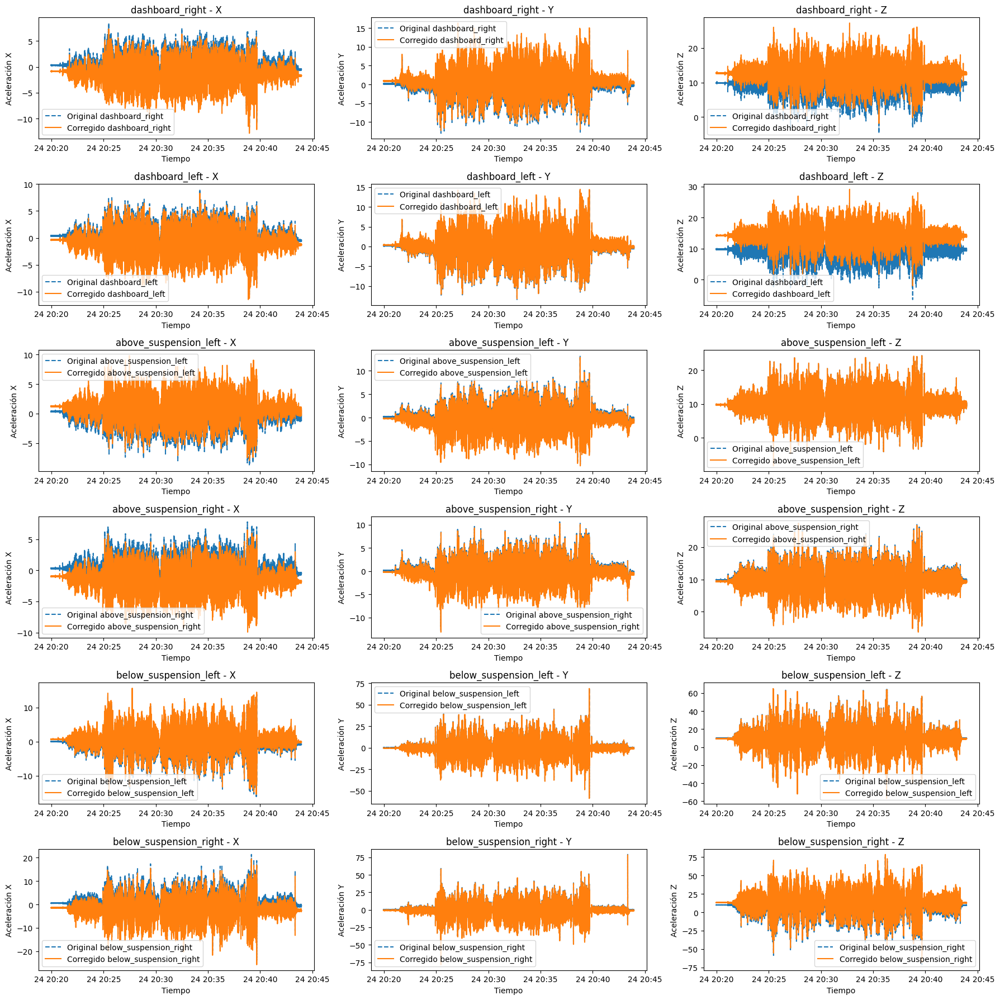

In [98]:

Ubicaciones_sensor = ['dashboard_right', 'dashboard_left', 'above_suspension_left', 'above_suspension_right', 'below_suspension_left', 'below_suspension_right']
ejes = ['x', 'y', 'z']

plt.figure(figsize=(18, 18))  # Graficamos las aceleraciopnes para verificar que se hizo bien la correcion

#
for i, sensor in enumerate(Ubicaciones_sensor):
    for j, axis in enumerate(ejes):
        plt.subplot(6, 3, i*3 + j + 1)
        col_original = f'acc_{axis}_{sensor}'
        col_corregido = f'acc_{axis}_{sensor}'
        
        plt.plot(df_PV1['timestamp'], df_PV1[col_original], label=f'Original {sensor}', linestyle='--')
        plt.plot(df_1['timestamp'], df_1[col_corregido], label=f'Corregido {sensor}')
        
        plt.xlabel('Tiempo')
        plt.ylabel(f'Aceleración {axis.upper()}')
        plt.title(f'{sensor} - {axis.upper()}')
        plt.legend()

plt.tight_layout()
plt.show()




In [99]:
df_sttngs_PV1['accelerometer_bias_x_right'] # Podemos ver que que coinciden las magnitudes y signo de los bias con las graficas

0   -1.164839
1   -1.284402
2   -1.942398
Name: accelerometer_bias_x_right, dtype: float64

In [100]:
df_sttngs_PV1['accelerometer_bias_z_left'] 

0    4.433583
1    0.016409
2   -0.445664
Name: accelerometer_bias_z_left, dtype: float64

In [101]:
df_sttngs_PV1

,placement_left,address_mpu_left,address_ak_left,gyroscope_full_scale_left,accelerometer_full_scale_left,magnetometer_full_scale_left,gyroscope_resolution_left,accelerometer_resolution_left,magnetometer_resolution_left,gyroscope_bias_x_left,...,accelerometer_bias_z_right,magnetometer_factory_sensitivity_x_right,magnetometer_factory_sensitivity_y_right,magnetometer_factory_sensitivity_z_right,magnetometer_soft_iron_distortion_x_right,magnetometer_soft_iron_distortion_y_right,magnetometer_soft_iron_distortion_z_right,magnetometer_hard_iron_distortion_x_right,magnetometer_hard_iron_distortion_y_right,magnetometer_hard_iron_distortion_z_right
0,dashboard,0x69,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,-0.064468,...,2.859215,1.175781,1.175781,1.140625,0.946237,1.08642,0.977778,9.960690,12.957712,-48.912897
1,above_suspension,0x68,0xc,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,1.509504,...,-0.425993,1.187500,1.187500,1.136719,3.035714,0.41769,3.617021,-37.747131,36.233684,37.070355
2,below_suspension,0x68,NaN,GFS_1000,AFS_8G,AK8963_BIT_16,0.030518,0.000244,0.149939,0.987825,...,3.165660,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [102]:
df_1['speed']

0         0.009128
1         0.009128
2         0.009128
3         0.009128
4         0.009128
            ...   
144031    0.005715
144032    0.005715
144033    0.005715
144034    0.005715
144035    0.005715
Name: speed, Length: 144036, dtype: float64

Para sacar el horizonte de prediccion necesitamos vamos a tomar unos 19 segundos de prediccion

In [103]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144036 entries, 0 to 144035
Data columns (total 73 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   acc_x_dashboard_left           144036 non-null  float64       
 1   acc_y_dashboard_left           144036 non-null  float64       
 2   acc_z_dashboard_left           144036 non-null  float64       
 3   acc_x_above_suspension_left    144036 non-null  float64       
 4   acc_y_above_suspension_left    144036 non-null  float64       
 5   acc_z_above_suspension_left    144036 non-null  float64       
 6   acc_x_below_suspension_left    144036 non-null  float64       
 7   acc_y_below_suspension_left    144036 non-null  float64       
 8   acc_z_below_suspension_left    144036 non-null  float64       
 9   gyro_x_dashboard_left          144036 non-null  float64       
 10  gyro_y_dashboard_left          144036 non-null  float64       
 11  

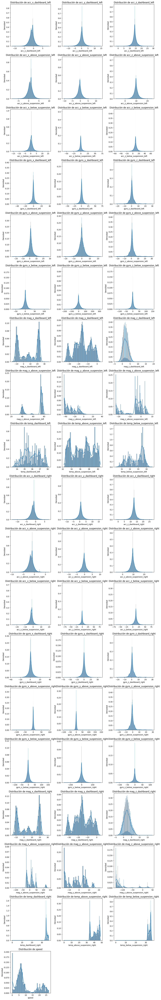

In [104]:
list_descart = ['timestamp','timestamp_gps','latitude','longitude','paved_road','unpaved_road','dirt_road','cobblestone_road',
                'asphalt_road','no_speed_bump','speed_bump_asphalt','speed_bump_cobblestone','good_road_left'
               ,'regular_road_left','regular_road_left','bad_road_left','good_road_right','regular_road_right','bad_road_right']
aux = df_1.drop(columns = list_descart)
list_columns = aux.columns

rows  = (len(list_columns) // 3) + (len(list_columns) % 3 > 0)
plt.figure(figsize = (12,rows*4))

for i, var in enumerate(list_columns, 1):
    plt.subplot(rows, 3, i)
    sns.histplot(df_1[var], kde = True, stat = 'density')
    plt.plot(linewidth = 2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

In [105]:
df_1['speed'].describe([0.01,.25,.50,.75,.99])

count    144036.000000
mean          9.556871
std           7.746386
min           0.002526
1%            0.004798
25%           4.508887
50%           6.618945
75%          16.647470
99%          26.015583
max          26.874480
Name: speed, dtype: float64

In [106]:
pd.set_option('display.max_rows', None) # df_1(9843,141244),df_2(3693,123094),df_3(7881,103982)
df_2['speed']

0          0.010822
1          0.010822
2          0.010822
3          0.010822
4          0.010822
5          0.010822
6          0.010822
7          0.010822
8          0.010822
9          0.010822
10         0.010822
11         0.010822
12         0.010822
13         0.010822
14         0.010822
15         0.010822
16         0.010822
17         0.010822
18         0.010822
19         0.010822
20         0.010822
21         0.010822
22         0.010822
23         0.010822
24         0.010822
25         0.010822
26         0.010822
27         0.010822
28         0.010822
29         0.010822
30         0.010822
31         0.010822
32         0.010822
33         0.010822
34         0.010822
35         0.010822
36         0.010822
37         0.010822
38         0.010822
39         0.010822
40         0.010822
41         0.010822
42         0.010822
43         0.010822
44         0.010822
45         0.010822
46         0.010822
47         0.010822
48         0.010822
49         0.010822


In [107]:
pd.reset_option('display.max_rows')

In [108]:
df_1 = df_1.iloc[9843:141244]# Eliminamos los datos donde el auto estaba estacionado
df_2 = df_2.iloc[3693:123094] 
df_3 = df_3.iloc[7881:103982] 

In [109]:
df_1

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,asphalt_road,no_speed_bump,speed_bump_asphalt,speed_bump_cobblestone,good_road_left,regular_road_left,bad_road_left,good_road_right,regular_road_right,bad_road_right
9843,0.375890,1.165976,13.472173,2.346318,1.304840,10.247183,0.478840,0.294487,8.856152,-0.183105,...,1,1,0,0,0,1,0,0,1,0
9844,0.146046,0.675165,14.374787,1.158794,0.289698,9.811438,1.137246,-1.810016,8.580819,0.091553,...,1,1,0,0,0,1,0,0,1,0
9845,-0.391452,1.108515,14.520833,1.759738,0.395043,9.696517,1.256956,-0.062249,8.487445,-0.183105,...,1,1,0,0,0,1,0,0,1,0
9846,-1.007959,0.656011,14.310143,1.113304,0.545878,10.162189,0.894234,2.106897,9.634267,0.915527,...,1,1,0,0,0,1,0,0,1,0
9847,-0.138864,1.309628,13.460202,1.510741,0.952892,10.299856,0.624887,-0.548272,9.440337,0.091553,...,1,1,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
141239,-1.134852,-2.109292,14.235923,0.718260,-2.375048,8.985439,0.124498,-1.903390,8.808268,-0.610352,...,1,1,0,0,0,1,0,0,1,0
141240,-1.130063,-1.771709,13.907917,1.094150,-2.221819,9.469068,-0.052672,-1.831564,9.459491,0.091553,...,1,1,0,0,0,1,0,0,1,0
141241,-1.136049,-1.884237,14.019248,1.146823,-1.976413,9.879673,-0.136469,-1.814805,9.193734,-0.152588,...,1,1,0,0,0,1,0,0,1,0
141242,-0.957681,-1.295263,14.190433,0.543484,-2.296039,8.717288,-0.105345,-1.735796,9.502586,0.427246,...,1,1,0,0,0,1,0,0,1,0


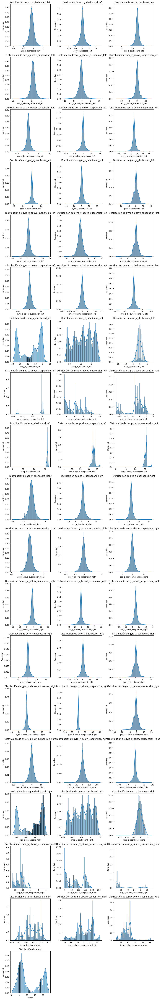

In [110]:
list_descart = ['timestamp','timestamp_gps','latitude','longitude','paved_road','unpaved_road','dirt_road','cobblestone_road',
                'asphalt_road','no_speed_bump','speed_bump_asphalt','speed_bump_cobblestone','good_road_left'
               ,'regular_road_left','regular_road_left','bad_road_left','good_road_right','regular_road_right','bad_road_right']
aux = df_3.drop(columns = list_descart)
list_columns = aux.columns

rows  = (len(list_columns) // 3) + (len(list_columns) % 3 > 0)
plt.figure(figsize = (12,rows*4))

for i, var in enumerate(list_columns, 1):
    plt.subplot(rows, 3, i)
    sns.histplot(df_3[var], kde = True, stat = 'density')
    plt.plot(linewidth = 2)
    plt.title(f'Distribución de {var}')
    plt.xlabel(var)
    plt.ylabel('Densidad')

plt.tight_layout()
plt.show()

In [111]:
df_1['Speed_Target'] = df_1['speed'].shift(-500) # Se crea una Velocidad como target y otras tres como caracterisitcas que sirvan para el modelo
df_2['Speed_Target'] = df_2['speed'].shift(-500) # en este caso elegi 5 segundos como horizonte de prediccion para tener un control suave d
df_3['Speed_Target'] = df_3['speed'].shift(-500)
df_1['speed_t-1'] = df_1['speed'].shift(50)
df_2['speed_t-1'] = df_2['speed'].shift(50)
df_3['speed_t-1'] = df_3['speed'].shift(50)
df_1['speed_t-1'] = df_1['speed'].shift(100)
df_2['speed_t-1'] = df_2['speed'].shift(100)
df_3['speed_t-1'] = df_3['speed'].shift(100)
df_1['speed_t-2'] = df_1['speed'].shift(200)
df_2['speed_t-2'] = df_2['speed'].shift(200)
df_3['speed_t-2'] = df_3['speed'].shift(200)
df_1['speed_t-3'] = df_1['speed'].shift(300)
df_2['speed_t-3'] = df_2['speed'].shift(300)
df_3['speed_t-3'] = df_3['speed'].shift(300)
df_1['speed_t-4'] = df_1['speed'].shift(400)
df_2['speed_t-4'] = df_2['speed'].shift(400)
df_3['speed_t-4'] = df_3['speed'].shift(400)

/tmp/ipykernel_5340/3450433057.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1['Speed_Target'] = df_1['speed'].shift(-500) # Se crea una Velocidad como target y otras tres como caracterisitcas que sirvan para el modelo
/tmp/ipykernel_5340/3450433057.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1['speed_t-1'] = df_1['speed'].shift(50)
/tmp/ipykernel_5340/3450433057.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,c

In [112]:
df_1.isnull().sum()

acc_x_dashboard_left             0
acc_y_dashboard_left             0
acc_z_dashboard_left             0
acc_x_above_suspension_left      0
acc_y_above_suspension_left      0
                              ... 
Speed_Target                   500
speed_t-1                      100
speed_t-2                      200
speed_t-3                      300
speed_t-4                      400
Length: 78, dtype: int64

In [113]:
df_1 = Calcular_Acel(df_1) # Se usan funciones para Calcular la aceleracion en magnitud por eje y en promedio
df_2 = Calcular_Acel(df_2)  
df_3 = Calcular_Acel(df_3)
df_1 = Calcular_Vel_Ang(df_1)
df_2 = Calcular_Vel_Ang(df_2)  
df_3 = Calcular_Vel_Ang(df_3)

/tmp/ipykernel_5340/1081401467.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['acc_x_avg'] = sum_x / num_prefijos
/tmp/ipykernel_5340/1081401467.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['acc_y_avg'] = sum_y / num_prefijos
/tmp/ipykernel_5340/1081401467.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/sta

In [114]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131401 entries, 9843 to 141243
Data columns (total 86 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   acc_x_dashboard_left           131401 non-null  float64       
 1   acc_y_dashboard_left           131401 non-null  float64       
 2   acc_z_dashboard_left           131401 non-null  float64       
 3   acc_x_above_suspension_left    131401 non-null  float64       
 4   acc_y_above_suspension_left    131401 non-null  float64       
 5   acc_z_above_suspension_left    131401 non-null  float64       
 6   acc_x_below_suspension_left    131401 non-null  float64       
 7   acc_y_below_suspension_left    131401 non-null  float64       
 8   acc_z_below_suspension_left    131401 non-null  float64       
 9   gyro_x_dashboard_left          131401 non-null  float64       
 10  gyro_y_dashboard_left          131401 non-null  float64       
 1

In [115]:
df_1.to_csv('df_1_full.csv', index =  False)
df_2.to_csv('df_2_full.csv', index =  False)
df_3.to_csv('df_3_full.csv', index =  False)

In [116]:
# df_1 = df_1.drop(['temp_below_suspension_right','temp_dashboard_right','temp_below_suspension_left','temp_dashboard_left',
#  'temp_above_suspension_right','temp_above_suspension_left','mag_x_dashboard_left','mag_y_dashboard_left','mag_z_dashboard_left',
#  'mag_x_above_suspension_left','mag_y_above_suspension_left','mag_z_above_suspension_left','mag_x_dashboard_right','mag_y_dashboard_right',
# 'mag_z_dashboard_right','mag_x_above_suspension_right','mag_y_above_suspension_right','mag_z_above_suspension_right'],axis = 1)
# df_2 = df_2.drop(['temp_below_suspension_right','temp_dashboard_right','temp_below_suspension_left','temp_dashboard_left',
#  'temp_above_suspension_right','temp_above_suspension_left','mag_x_dashboard_left','mag_y_dashboard_left','mag_z_dashboard_left',
#  'mag_x_above_suspension_left','mag_y_above_suspension_left','mag_z_above_suspension_left','mag_x_dashboard_right','mag_y_dashboard_right',
# 'mag_z_dashboard_right','mag_x_above_suspension_right','mag_y_above_suspension_right','mag_z_above_suspension_right'],axis = 1)
# df_3 = df_3.drop(['temp_below_suspension_right','temp_dashboard_right','temp_below_suspension_left','temp_dashboard_left',
#  'temp_above_suspension_right','temp_above_suspension_left','mag_x_dashboard_left','mag_y_dashboard_left','mag_z_dashboard_left',
#  'mag_x_above_suspension_left','mag_y_above_suspension_left','mag_z_above_suspension_left','mag_x_dashboard_right','mag_y_dashboard_right',
# 'mag_z_dashboard_right','mag_x_above_suspension_right','mag_y_above_suspension_right','mag_z_above_suspension_right'],axis = 1)

In [117]:
# df_1 = df_1.drop(['acc_x_dashboard_left', 'acc_y_dashboard_left', 'acc_z_dashboard_left',
#               'acc_x_dashboard_right', 'acc_y_dashboard_right', 'acc_z_dashboard_right',
#               'acc_x_above_suspension_left', 'acc_y_above_suspension_left', 'acc_z_above_suspension_left',
#               'acc_x_above_suspension_right', 'acc_y_above_suspension_right', 'acc_z_above_suspension_right',
#               'acc_x_below_suspension_left', 'acc_y_below_suspension_left', 'acc_z_below_suspension_left',
#               'acc_x_below_suspension_right', 'acc_y_below_suspension_right', 'acc_z_below_suspension_right'], axis=1)
# df_2 = df_2.drop(['acc_x_dashboard_left', 'acc_y_dashboard_left', 'acc_z_dashboard_left',
#               'acc_x_dashboard_right', 'acc_y_dashboard_right', 'acc_z_dashboard_right',
#               'acc_x_above_suspension_left', 'acc_y_above_suspension_left', 'acc_z_above_suspension_left',
#               'acc_x_above_suspension_right', 'acc_y_above_suspension_right', 'acc_z_above_suspension_right',
#               'acc_x_below_suspension_left', 'acc_y_below_suspension_left', 'acc_z_below_suspension_left',
#               'acc_x_below_suspension_right', 'acc_y_below_suspension_right', 'acc_z_below_suspension_right'], axis=1)
# df_3 = df_3.drop(['acc_x_dashboard_left', 'acc_y_dashboard_left', 'acc_z_dashboard_left',
#               'acc_x_dashboard_right', 'acc_y_dashboard_right', 'acc_z_dashboard_right',
#               'acc_x_above_suspension_left', 'acc_y_above_suspension_left', 'acc_z_above_suspension_left',
#               'acc_x_above_suspension_right', 'acc_y_above_suspension_right', 'acc_z_above_suspension_right',
#               'acc_x_below_suspension_left', 'acc_y_below_suspension_left', 'acc_z_below_suspension_left',
#               'acc_x_below_suspension_right', 'acc_y_below_suspension_right', 'acc_z_below_suspension_right'], axis=1)

In [118]:
# df_1 = df_1.drop(['gyro_x_dashboard_left', 'gyro_y_dashboard_left', 'gyro_z_dashboard_left',
#               'gyro_x_dashboard_right', 'gyro_y_dashboard_right', 'gyro_z_dashboard_right',
#               'gyro_x_above_suspension_left', 'gyro_y_above_suspension_left', 'gyro_z_above_suspension_left',
#               'gyro_x_above_suspension_right', 'gyro_y_above_suspension_right', 'gyro_z_above_suspension_right',
#               'gyro_x_below_suspension_left', 'gyro_y_below_suspension_left', 'gyro_z_below_suspension_left',
#               'gyro_x_below_suspension_right', 'gyro_y_below_suspension_right', 'gyro_z_below_suspension_right'], axis=1)

# df_2 = df_2.drop(['gyro_x_dashboard_left', 'gyro_y_dashboard_left', 'gyro_z_dashboard_left',
#               'gyro_x_dashboard_right', 'gyro_y_dashboard_right', 'gyro_z_dashboard_right',
#               'gyro_x_above_suspension_left', 'gyro_y_above_suspension_left', 'gyro_z_above_suspension_left',
#               'gyro_x_above_suspension_right', 'gyro_y_above_suspension_right', 'gyro_z_above_suspension_right',
#               'gyro_x_below_suspension_left', 'gyro_y_below_suspension_left', 'gyro_z_below_suspension_left',
#               'gyro_x_below_suspension_right', 'gyro_y_below_suspension_right', 'gyro_z_below_suspension_right'], axis=1)

# df_3 = df_3.drop(['gyro_x_dashboard_left', 'gyro_y_dashboard_left', 'gyro_z_dashboard_left',
#               'gyro_x_dashboard_right', 'gyro_y_dashboard_right', 'gyro_z_dashboard_right',
#               'gyro_x_above_suspension_left', 'gyro_y_above_suspension_left', 'gyro_z_above_suspension_left',
#               'gyro_x_above_suspension_right', 'gyro_y_above_suspension_right', 'gyro_z_above_suspension_right',
#               'gyro_x_below_suspension_left', 'gyro_y_below_suspension_left', 'gyro_z_below_suspension_left',
#               'gyro_x_below_suspension_right', 'gyro_y_below_suspension_right', 'gyro_z_below_suspension_right'], axis=1)
# Se retiran todas las caracteristicas que nos sirvieron para calcular las caracteristicas principales y otras que no sirven de mucho
# como la temperatura y las mediciones de magnetometro

In [119]:
df_1['acc_magnitude_avg_t-1'] = df_1['acc_magnitude_avg'].shift(100)
df_2['acc_magnitude_avg_t-1'] = df_2['acc_magnitude_avg'].shift(100)
df_3['acc_magnitude_avg_t-1'] = df_3['acc_magnitude_avg'].shift(100)
df_1['acc_magnitude_avg_t-2'] = df_1['acc_magnitude_avg'].shift(200)
df_2['acc_magnitude_avg_t-2'] = df_2['acc_magnitude_avg'].shift(200)
df_3['acc_magnitude_avg_t-2'] = df_3['acc_magnitude_avg'].shift(200)
df_1['acc_magnitude_avg_t-3'] = df_1['acc_magnitude_avg'].shift(300)
df_2['acc_magnitude_avg_t-3'] = df_2['acc_magnitude_avg'].shift(300)
df_3['acc_magnitude_avg_t-3'] = df_3['acc_magnitude_avg'].shift(300)
df_1['acc_magnitude_avg_t-4'] = df_1['acc_magnitude_avg'].shift(400)
df_2['acc_magnitude_avg_t-4'] = df_2['acc_magnitude_avg'].shift(400)
df_3['acc_magnitude_avg_t-4'] = df_3['acc_magnitude_avg'].shift(400)

/tmp/ipykernel_5340/758482623.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1['acc_magnitude_avg_t-1'] = df_1['acc_magnitude_avg'].shift(100)
/tmp/ipykernel_5340/758482623.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1['acc_magnitude_avg_t-2'] = df_1['acc_magnitude_avg'].shift(200)
/tmp/ipykernel_5340/758482623.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

In [120]:
df_3.isnull().sum()

acc_x_dashboard_left             0
acc_y_dashboard_left             0
acc_z_dashboard_left             0
acc_x_above_suspension_left      0
acc_y_above_suspension_left      0
                              ... 
gyro_magnitude_avg               0
acc_magnitude_avg_t-1          100
acc_magnitude_avg_t-2          200
acc_magnitude_avg_t-3          300
acc_magnitude_avg_t-4          400
Length: 90, dtype: int64

In [121]:
df_1 = df_1.dropna()
df_2 = df_2.dropna()
df_3 = df_3.dropna()

In [122]:
df_3.isnull().sum()

acc_x_dashboard_left           0
acc_y_dashboard_left           0
acc_z_dashboard_left           0
acc_x_above_suspension_left    0
acc_y_above_suspension_left    0
                              ..
gyro_magnitude_avg             0
acc_magnitude_avg_t-1          0
acc_magnitude_avg_t-2          0
acc_magnitude_avg_t-3          0
acc_magnitude_avg_t-4          0
Length: 90, dtype: int64

In [123]:
df_1['timestamp'] = pd.to_datetime(df_1['timestamp'],unit = 's')
df_1['timestamp_gps'] = pd.to_datetime(df_1['timestamp_gps'],unit = 's')
df_2['timestamp'] = pd.to_datetime(df_2['timestamp'],unit = 's')
df_2['timestamp_gps'] = pd.to_datetime(df_2['timestamp_gps'],unit = 's')
df_3['timestamp'] = pd.to_datetime(df_3['timestamp'],unit = 's')
df_3['timestamp_gps'] = pd.to_datetime(df_3['timestamp_gps'],unit = 's')

/tmp/ipykernel_5340/3263543821.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1['timestamp'] = pd.to_datetime(df_1['timestamp'],unit = 's')
/tmp/ipykernel_5340/3263543821.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1['timestamp_gps'] = pd.to_datetime(df_1['timestamp_gps'],unit = 's')


In [124]:
df_3 #Podemos ver que el time stam de gps varia menos por lo que me quedare con el original

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,acc_z_avg,acc_magnitude_avg,gyro_x_avg,gyro_y_avg,gyro_z_avg,gyro_magnitude_avg,acc_magnitude_avg_t-1,acc_magnitude_avg_t-2,acc_magnitude_avg_t-3,acc_magnitude_avg_t-4
8281,-0.766145,0.584185,13.577518,0.246603,-0.246603,9.974244,0.100556,-0.328006,9.785102,-0.793457,...,11.491370,11.547786,0.579834,-0.368754,0.549316,0.879736,11.669802,11.422858,11.394689,11.551435
8282,-0.897826,0.979228,14.755465,0.509965,-0.158017,10.323798,0.033519,-0.028730,9.737218,-0.549316,...,11.501346,11.558194,0.671387,0.689189,0.760396,1.226354,11.732349,11.489835,11.613470,11.572774
8283,-0.864307,0.840365,14.420277,0.689530,-0.014365,10.419566,0.040701,0.143652,9.560047,-0.640869,...,11.465034,11.522651,-0.076294,0.679016,0.638326,0.935063,11.375485,11.514738,11.577828,11.190447
8284,-0.823605,0.256180,14.714763,0.408211,-0.289698,10.309432,0.004788,0.308852,9.633070,-0.885010,...,11.373855,11.431427,0.239054,0.002543,0.709534,0.748727,11.236911,11.420281,11.220329,11.553266
8285,-1.151611,0.696713,14.089877,0.390853,-0.196325,10.176554,-0.029329,0.305859,9.603741,-0.915527,...,11.208355,11.261687,0.038147,0.269572,0.567118,0.629085,11.284415,11.382235,11.468626,11.480008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103477,-0.751779,-1.242591,13.591883,0.555455,-1.616086,9.696517,0.603339,-1.213860,8.492233,-1.342773,...,10.935516,11.050773,0.859578,2.380371,-0.091553,2.532474,11.142183,11.236468,11.084578,11.219388
103478,-1.362301,-1.508347,13.874399,0.677559,-1.386243,10.031705,-0.670376,-1.472434,8.322245,-0.183105,...,11.222022,11.445525,-0.605265,-1.022339,-0.523885,1.298452,11.493950,11.254312,11.759345,12.291465
103479,-1.355118,-0.222661,14.563929,0.272939,-1.968034,7.405266,-0.596156,-3.524265,8.319851,-1.586914,...,11.078370,11.285556,-0.986735,-2.176921,-0.597636,2.463696,11.023920,11.491217,11.567065,11.503020
103480,-1.169568,-1.921347,13.500903,0.902614,-1.810016,8.923190,-0.095768,-1.516727,8.954314,-0.854492,...,11.232597,11.354601,0.287374,-0.864665,-0.559489,1.069232,11.422023,11.542409,11.175456,10.719307


In [125]:
df_1 = df_1.drop('timestamp_gps',axis = 1)
df_2 = df_2.drop('timestamp_gps',axis = 1)
df_3 = df_3.drop('timestamp_gps',axis = 1)

In [126]:
df_3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95201 entries, 8281 to 103481
Data columns (total 89 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   acc_x_dashboard_left           95201 non-null  float64       
 1   acc_y_dashboard_left           95201 non-null  float64       
 2   acc_z_dashboard_left           95201 non-null  float64       
 3   acc_x_above_suspension_left    95201 non-null  float64       
 4   acc_y_above_suspension_left    95201 non-null  float64       
 5   acc_z_above_suspension_left    95201 non-null  float64       
 6   acc_x_below_suspension_left    95201 non-null  float64       
 7   acc_y_below_suspension_left    95201 non-null  float64       
 8   acc_z_below_suspension_left    95201 non-null  float64       
 9   gyro_x_dashboard_left          95201 non-null  float64       
 10  gyro_y_dashboard_left          95201 non-null  float64       
 11  gyro_z_dashboard

In [127]:
df_1

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,acc_z_avg,acc_magnitude_avg,gyro_x_avg,gyro_y_avg,gyro_z_avg,gyro_magnitude_avg,acc_magnitude_avg_t-1,acc_magnitude_avg_t-2,acc_magnitude_avg_t-3,acc_magnitude_avg_t-4
10243,-0.955286,-0.234632,15.035586,0.696713,-0.234632,9.763554,0.462081,-0.670376,10.103531,-1.922607,...,11.219029,11.243363,-0.719706,2.052307,-5.734762,6.133305,11.640243,11.500847,11.034913,11.178157
10244,-1.021127,0.319626,14.189236,0.557849,0.203507,10.807426,0.632069,-1.381454,10.218453,-1.983643,...,11.040661,11.062450,-0.498454,1.902262,-3.115336,3.684071,11.655013,11.715343,11.057294,11.239022
10245,-1.199495,0.821211,14.987702,0.577003,-0.195127,10.198102,0.148441,-1.498770,9.392453,-1.678467,...,11.173141,11.204466,-0.139872,1.258850,-2.545675,2.843365,11.604243,11.809643,11.396549,11.211858
10246,-1.048660,0.141258,15.090653,0.227449,0.155623,10.781090,-0.366313,-0.677559,9.588778,-1.037598,...,11.747150,11.788938,-0.310262,0.890096,-0.600179,1.117474,11.444361,11.484994,11.546067,11.694704
10247,-0.821211,-0.009577,13.285425,0.718260,-0.440533,9.967062,-0.148441,-0.464475,8.956708,-1.281738,...,11.051834,11.075405,-1.070658,-0.384013,0.910441,1.456941,11.456193,11.666853,11.355733,11.365829
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140739,-1.149217,-1.991976,13.699622,0.373495,-2.085350,9.921572,-0.397437,-1.000776,8.664616,-1.373291,...,11.068594,11.250882,-0.457764,-0.244141,0.078837,0.524755,11.074254,11.002894,9.685810,11.287511
140740,-1.271321,-1.489193,13.500903,0.931344,-1.728614,8.944737,-0.002394,-2.995146,7.862558,-0.640869,...,10.847130,11.061524,0.015259,0.239054,0.129700,0.272400,11.464343,10.855746,11.810654,11.486291
140741,-1.663970,-1.017536,14.205996,0.730232,-1.618480,8.827422,0.045490,-1.903390,10.266337,-1.388550,...,11.246962,11.385349,-2.723694,-2.365112,0.615438,3.659375,11.076972,11.709568,17.069668,12.303098
140742,-1.429338,-1.836353,13.575123,0.330400,-2.408567,9.403227,0.247800,-1.672350,9.756372,-1.159668,...,10.860697,11.063601,-0.279744,-0.122070,0.882467,0.933759,11.368290,11.498374,16.303198,12.047835


<Axes: >

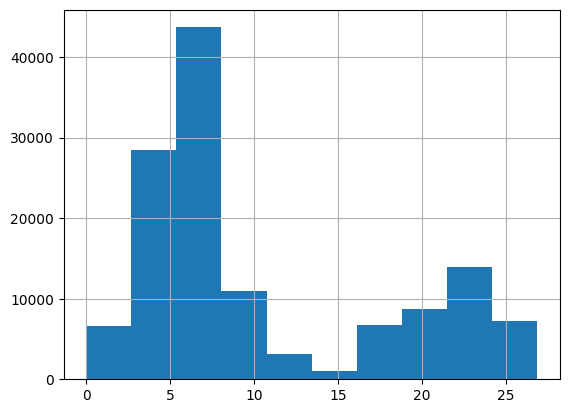

In [128]:
df_1['speed'].hist()

<Axes: >

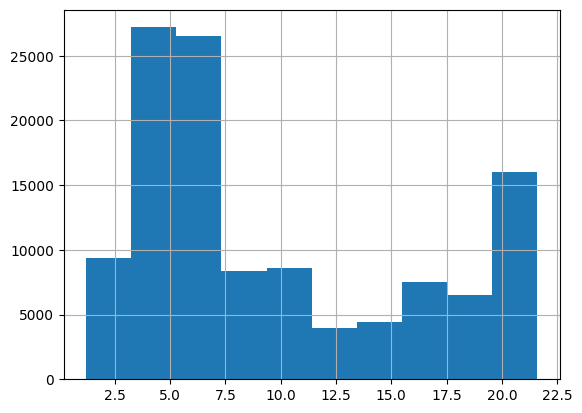

In [129]:
df_2['speed'].hist()

<Axes: >

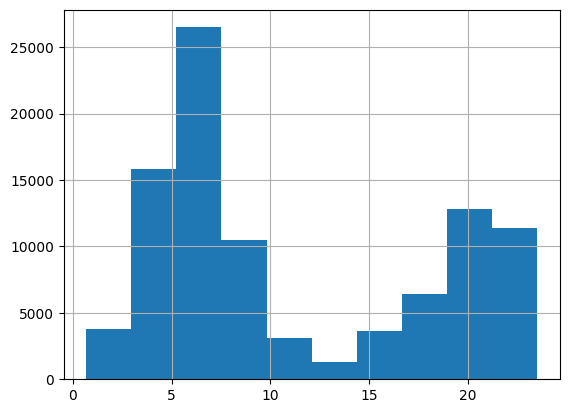

In [130]:
df_3['speed'].hist()

<Axes: >

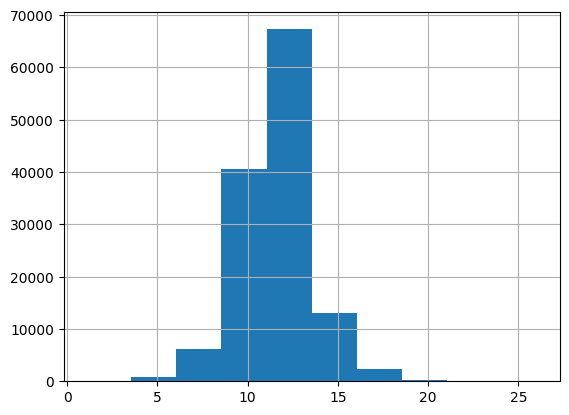

In [131]:
df_1['acc_magnitude_avg'].hist()

<Axes: >

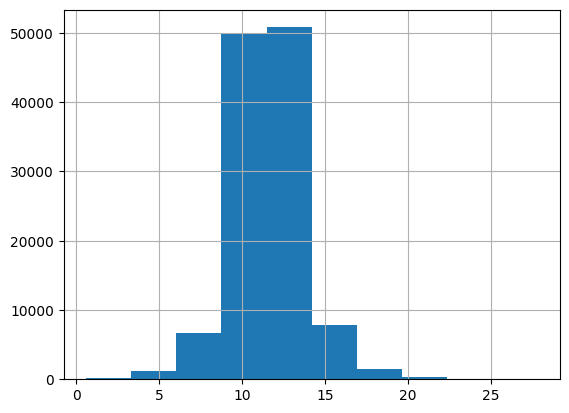

In [132]:
df_2['acc_magnitude_avg'].hist()

<Axes: >

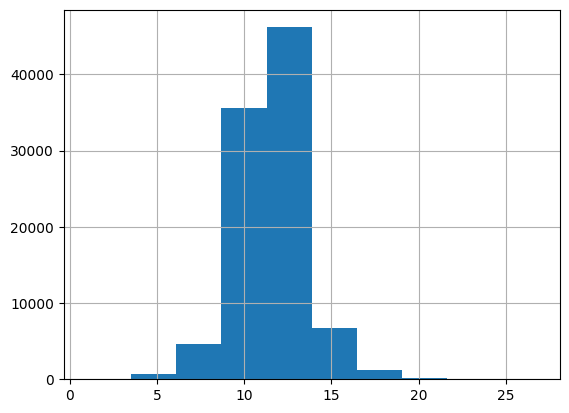

In [133]:
df_3['acc_magnitude_avg'].hist()

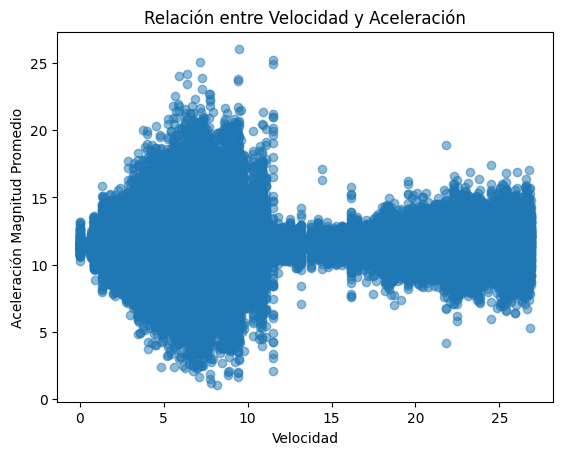

In [134]:
plt.scatter(df_1['speed'], df_1['acc_magnitude_avg'], alpha=0.5)
plt.title('Relación entre Velocidad y Aceleración')
plt.xlabel('Velocidad')
plt.ylabel('Aceleración Magnitud Promedio')
plt.show()

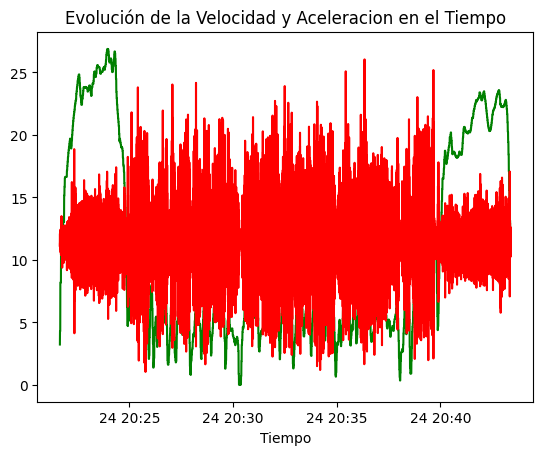

In [135]:
plt.plot(df_1['timestamp'], df_1['speed'], color='green')
plt.plot(df_1['timestamp'], df_1['acc_magnitude_avg'], color='red')
plt.title('Evolución de la Velocidad y Aceleracion en el Tiempo')
plt.xlabel('Tiempo')
plt.show()


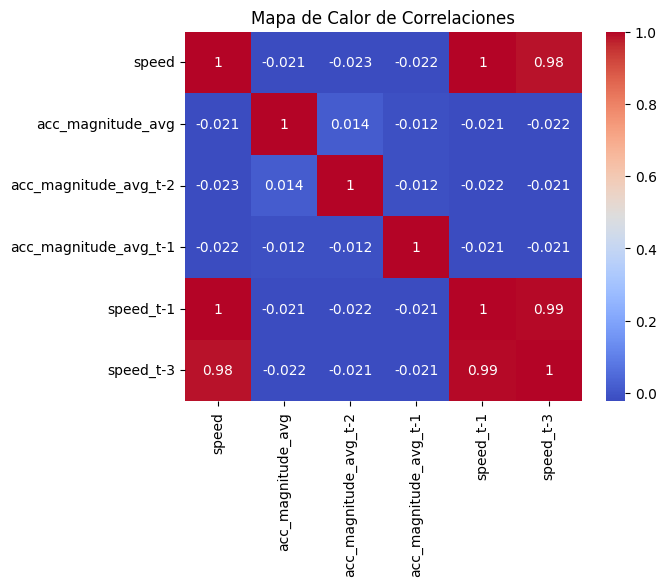

In [136]:
correlation_matrix = df_1[['speed', 'acc_magnitude_avg', 'acc_magnitude_avg_t-2', 'acc_magnitude_avg_t-1', 'speed_t-1','speed_t-3']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Mapa de Calor de Correlaciones')
plt.show()

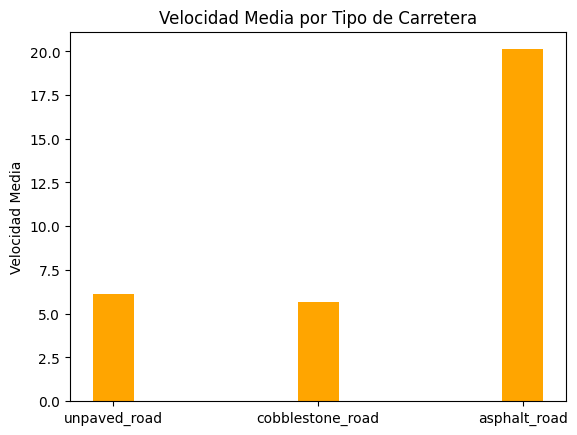

In [137]:
road_types = ['unpaved_road',  'cobblestone_road', 'asphalt_road']
avg_speed = [df_1[df_1[road_type] == 1]['speed'].mean() for road_type in road_types]
bar_width = 0.2
plt.bar(road_types, avg_speed, color='orange',width=bar_width)
plt.title('Velocidad Media por Tipo de Carretera')
plt.ylabel('Velocidad Media')
plt.show()


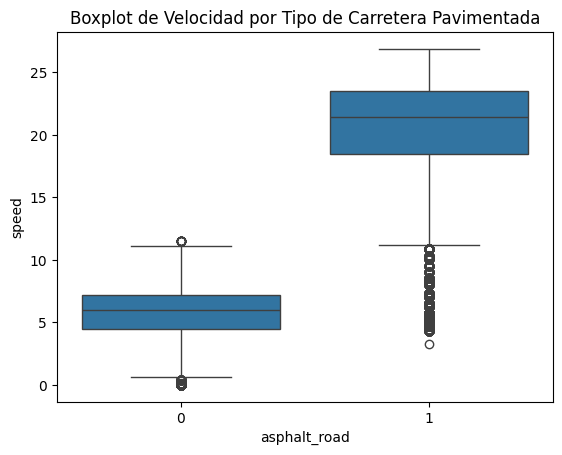

In [138]:
sns.boxplot(x='asphalt_road', y='speed', data=df_1)
plt.title('Boxplot de Velocidad por Tipo de Carretera Pavimentada')
plt.show()


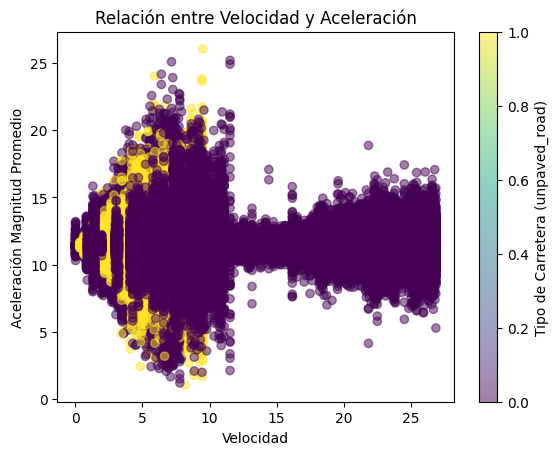

In [139]:
plt.scatter(df_1['speed'], df_1['acc_magnitude_avg'], c=df_1['unpaved_road'], cmap='viridis', alpha=0.5)
plt.colorbar(label='Tipo de Carretera (unpaved_road)')
plt.title('Relación entre Velocidad y Aceleración')
plt.xlabel('Velocidad')
plt.ylabel('Aceleración Magnitud Promedio')
plt.show()


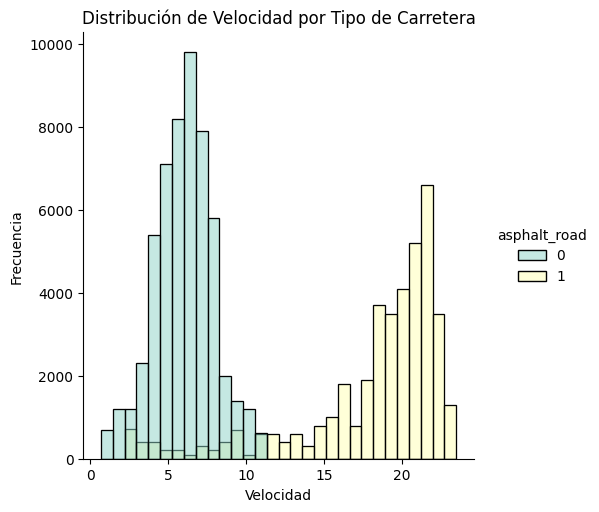

In [140]:
sns.displot(df_3, x='speed', hue='asphalt_road', kind='hist', bins=30, palette='Set3')

plt.title('Distribución de Velocidad por Tipo de Carretera')
plt.xlabel('Velocidad')
plt.ylabel('Frecuencia')

plt.show()

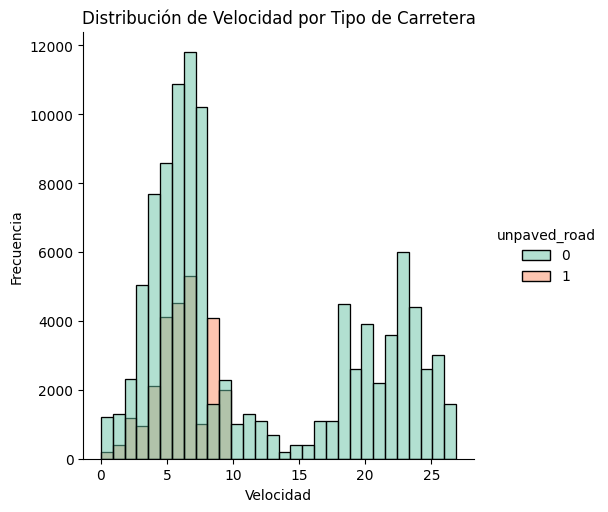

In [141]:
sns.displot(df_1, x='speed', hue='unpaved_road', kind='hist', bins=30, palette='Set2')

plt.title('Distribución de Velocidad por Tipo de Carretera')
plt.xlabel('Velocidad')
plt.ylabel('Frecuencia')

plt.show()

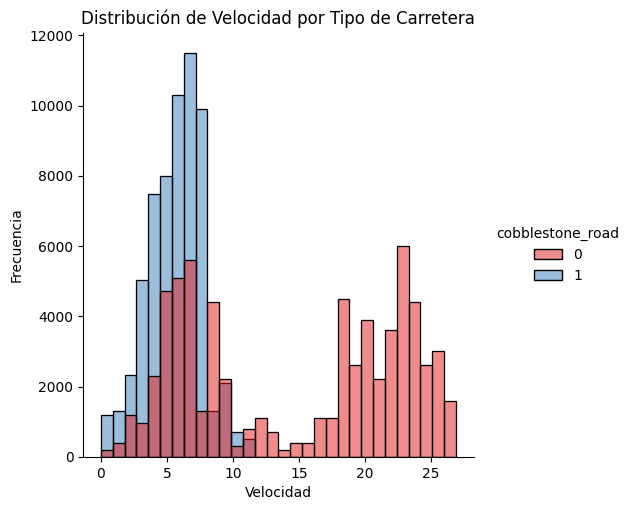

In [142]:
sns.displot(df_1, x='speed', hue='cobblestone_road', kind='hist', bins=30, palette='Set1')

plt.title('Distribución de Velocidad por Tipo de Carretera')
plt.xlabel('Velocidad')
plt.ylabel('Frecuencia')

plt.show()

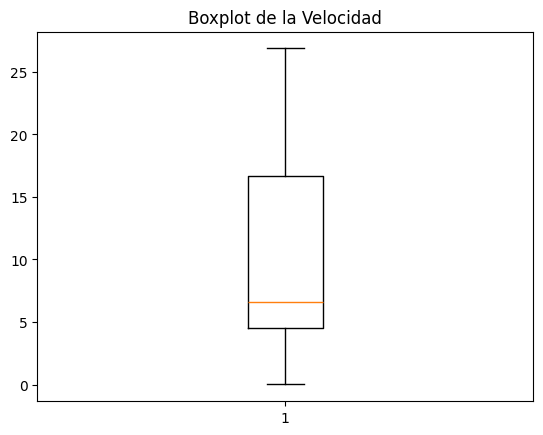

In [143]:
plt.boxplot(df['speed'])
plt.title('Boxplot de la Velocidad')
plt.show()


In [144]:
df_1[df_1['unpaved_road'] == 1]

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,acc_z_avg,acc_magnitude_avg,gyro_x_avg,gyro_y_avg,gyro_z_avg,gyro_magnitude_avg,acc_magnitude_avg_t-1,acc_magnitude_avg_t-2,acc_magnitude_avg_t-3,acc_magnitude_avg_t-4
30831,0.399832,-1.984793,15.746664,1.350330,-1.331176,8.470685,1.333570,-6.924031,48.590323,-7.324219,...,17.818646,17.944878,-5.783081,3.031413,0.175476,6.531790,11.105431,11.593391,11.872394,11.476250
30832,-3.277662,-0.533907,15.629348,0.045490,-3.043030,8.080431,-1.151611,-4.005499,33.923443,-6.805420,...,14.587073,14.694093,-1.429240,20.055135,3.550212,20.417031,10.704611,11.431935,11.789670,11.100335
30833,-1.980005,-3.459621,14.281413,-1.256956,-4.015076,11.935095,3.100491,18.880674,15.710751,-5.126953,...,11.426726,11.510999,0.157674,22.801717,-2.009074,22.890599,9.563529,11.533955,11.849210,10.846202
30834,1.110910,0.306458,14.480132,1.553837,-1.738190,12.370840,-0.617704,-1.142034,-7.254431,-4.333496,...,7.431602,7.507852,1.576742,12.807210,-6.764730,14.569568,10.730134,11.519600,11.344122,11.261484
30835,-0.373495,-0.361524,12.507309,1.920150,0.081403,10.228029,-4.249708,0.782904,-8.386888,-2.227783,...,6.877145,7.051023,-0.869751,11.044820,-6.042480,12.619671,11.008686,11.322231,10.809746,11.458243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109556,-0.402226,0.399832,14.006080,2.267309,-0.248997,7.912836,3.050213,-0.038307,5.133168,6.256104,...,10.501567,10.514287,2.263387,-9.122213,-11.978149,15.225431,13.534564,11.203631,11.602938,11.069220
109557,0.574608,-0.251391,13.917494,2.217031,-0.842759,8.463503,2.937685,-1.565808,9.071630,5.950928,...,10.804234,10.823757,1.251221,-7.542928,-11.377970,13.708374,13.748188,12.674548,11.697857,12.124647
109558,0.363919,-0.476446,14.556746,2.365471,-1.285686,8.916007,2.367865,-2.770091,10.615890,6.195068,...,10.769518,10.798745,2.268473,-4.501343,-11.459351,12.518977,13.317177,12.099748,11.487112,12.482350
109559,-0.492008,-0.300472,14.557943,1.666364,-0.798466,8.389283,3.138798,-0.234632,9.915586,6.958008,...,10.464856,10.485555,3.641764,-3.143311,-12.931824,13.797642,12.055218,12.451801,10.254727,11.984775


In [145]:
df_3['unpaved_road'].equals(df_3['dirt_road'])

True

In [146]:
df_3['paved_road'].equals(df_3['cobblestone_road'])

False

In [147]:
df_1 = df_1.drop(['dirt_road'],axis = 1)
df_2 = df_2.drop(['dirt_road'],axis = 1)
df_3 = df_3.drop(['dirt_road'],axis = 1)

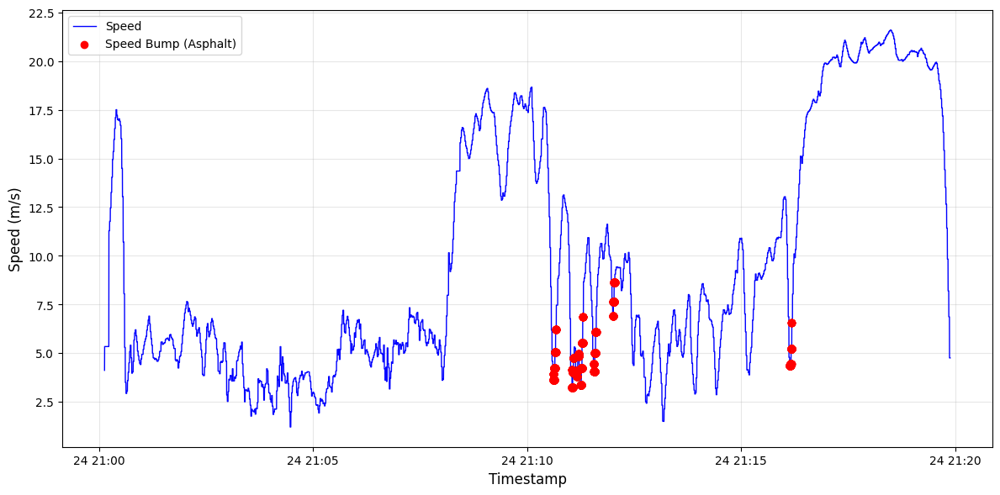

In [148]:
speed_bump_asphalt = df_2[df_2['speed_bump_asphalt'] == 1]

plt.figure(figsize=(12, 6))
plt.plot(df_2['timestamp'], df_2['speed'], label='Speed', color='blue', linewidth=1)
plt.scatter(speed_bump_asphalt['timestamp'], speed_bump_asphalt['speed'], 
            color='red', label='Speed Bump (Asphalt)', zorder=5)


plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('Speed (m/s)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()


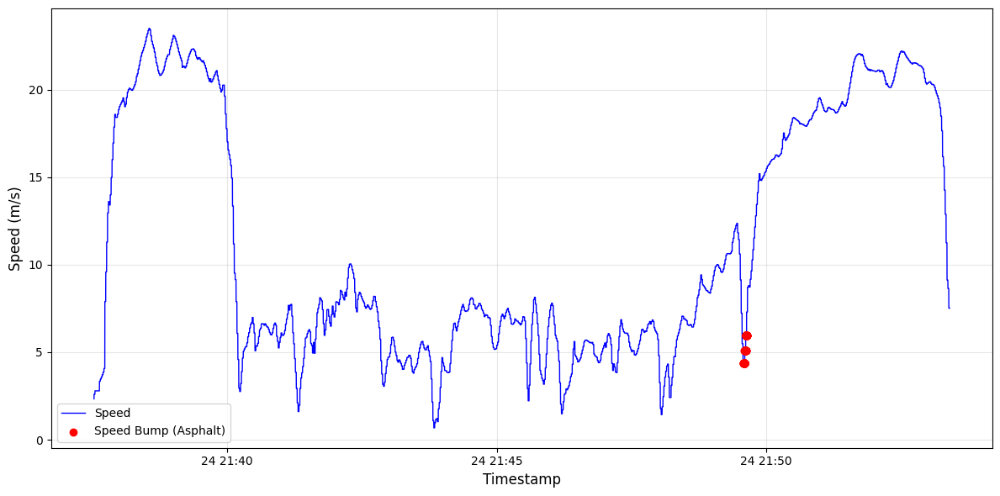

In [149]:
speed_bump_asphalt = df_3[df_3['speed_bump_asphalt'] == 1]

plt.figure(figsize=(12, 6))
plt.plot(df_3['timestamp'], df_3['speed'], label='Speed', color='blue', linewidth=1)
plt.scatter(speed_bump_asphalt['timestamp'], speed_bump_asphalt['speed'], 
            color='red', label='Speed Bump (Asphalt)', zorder=5)


plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('Speed (m/s)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()


In [150]:
df_3['bad_road_right'].equals(df_3['unpaved_road'])

False

In [151]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 130501 entries, 10243 to 140743
Data columns (total 88 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   acc_x_dashboard_left           130501 non-null  float64       
 1   acc_y_dashboard_left           130501 non-null  float64       
 2   acc_z_dashboard_left           130501 non-null  float64       
 3   acc_x_above_suspension_left    130501 non-null  float64       
 4   acc_y_above_suspension_left    130501 non-null  float64       
 5   acc_z_above_suspension_left    130501 non-null  float64       
 6   acc_x_below_suspension_left    130501 non-null  float64       
 7   acc_y_below_suspension_left    130501 non-null  float64       
 8   acc_z_below_suspension_left    130501 non-null  float64       
 9   gyro_x_dashboard_left          130501 non-null  float64       
 10  gyro_y_dashboard_left          130501 non-null  float64       
 11  g

In [152]:
df_1['speed'].quantile([0.005, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.995])

0.005     0.359174
0.050     2.678270
0.100     3.660012
0.200     4.749297
0.300     5.642291
0.400     6.348241
0.500     7.021479
0.600     7.906822
0.700    11.802369
0.800    20.175163
0.900    23.070250
0.950    24.650892
0.995    26.570883
Name: speed, dtype: float64

In [153]:
df_2['speed'].quantile([0.005, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.995])

0.005     1.867397
0.050     2.921101
0.100     3.547691
0.200     4.504519
0.300     5.207082
0.400     5.879925
0.500     6.892533
0.600     9.282341
0.700    13.036846
0.800    17.362730
0.900    20.044376
0.950    20.537240
0.995    21.446087
Name: speed, dtype: float64

In [154]:
df_3['speed'].quantile([0.005, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 0.995])

0.005     1.167822
0.050     3.203404
0.100     4.188515
0.200     5.180883
0.300     6.066790
0.400     6.774456
0.500     7.670777
0.600     9.976994
0.700    18.013970
0.800    20.129480
0.900    21.390558
0.950    21.975540
0.995    23.096762
Name: speed, dtype: float64

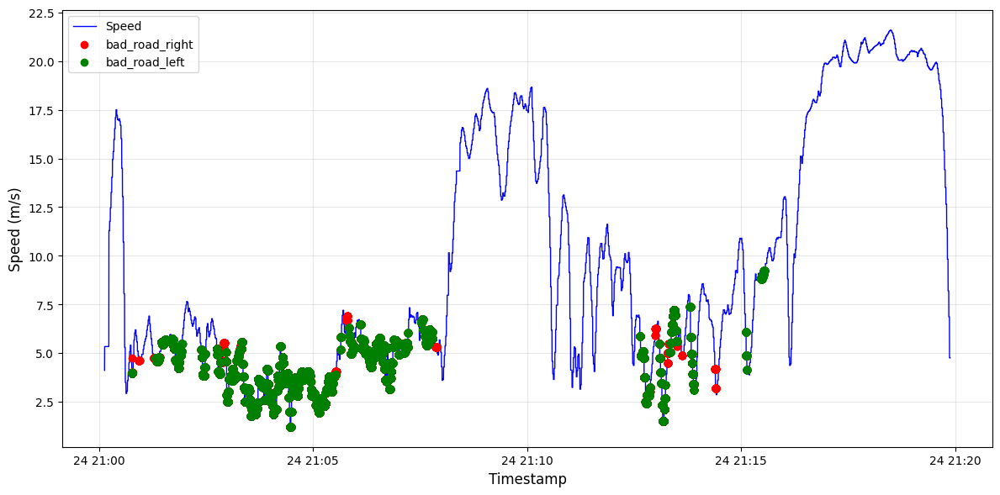

In [155]:
bad_road_right = df_2[df_2['bad_road_right'] == 1]
bad_road_left = df_2[df_2['bad_road_left'] == 1]

plt.figure(figsize=(12, 6))
plt.plot(df_2['timestamp'], df_2['speed'], label='Speed', color='blue', linewidth=1)
plt.scatter(bad_road_right['timestamp'], bad_road_right['speed'], 
            color='red', label='bad_road_right', zorder=5)
plt.scatter(bad_road_left['timestamp'], bad_road_left['speed'], 
            color='green', label='bad_road_left', zorder=5)

plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('Speed (m/s)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()


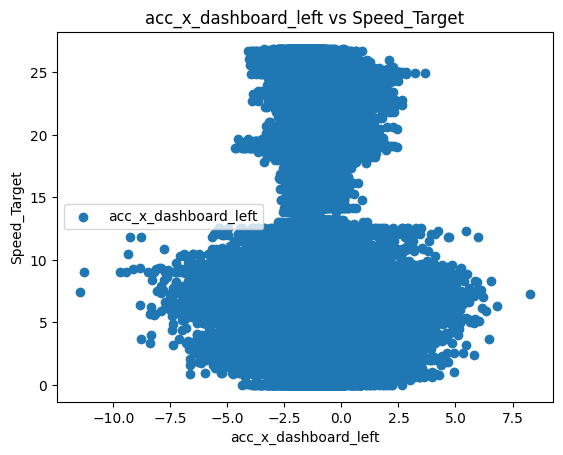

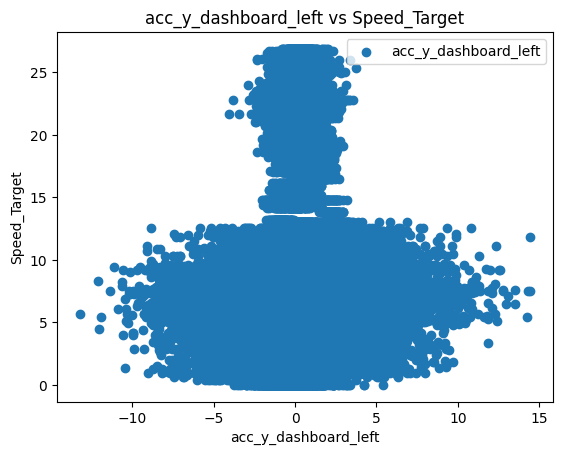

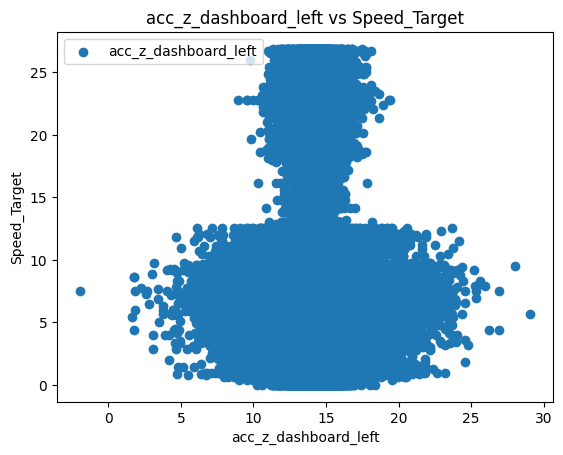

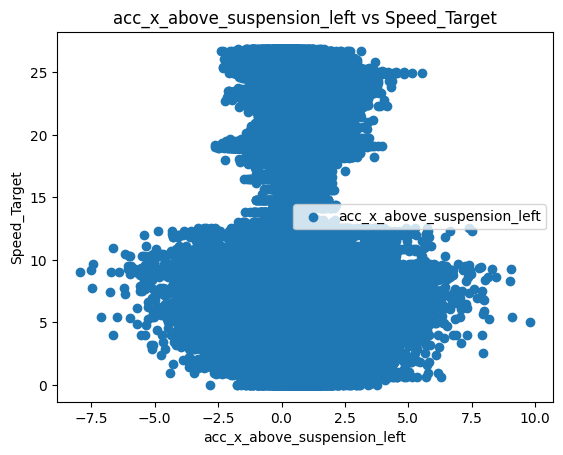

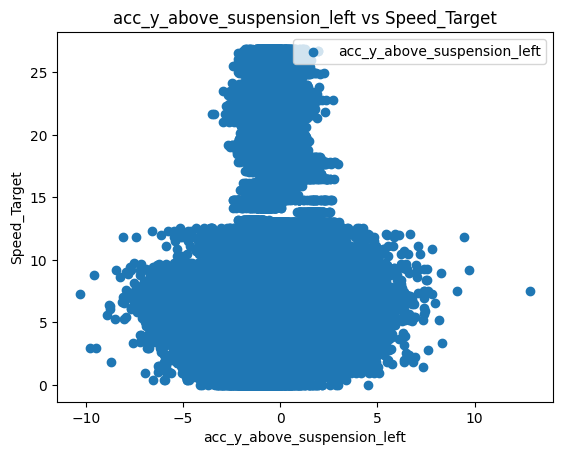

...

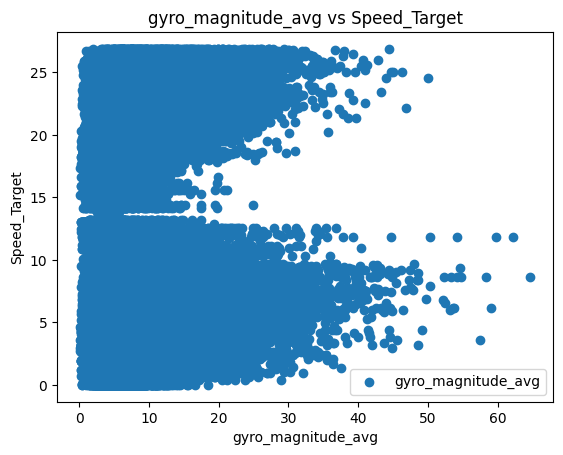

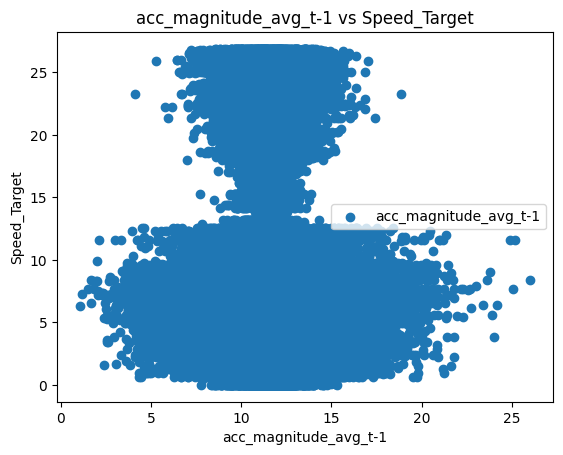

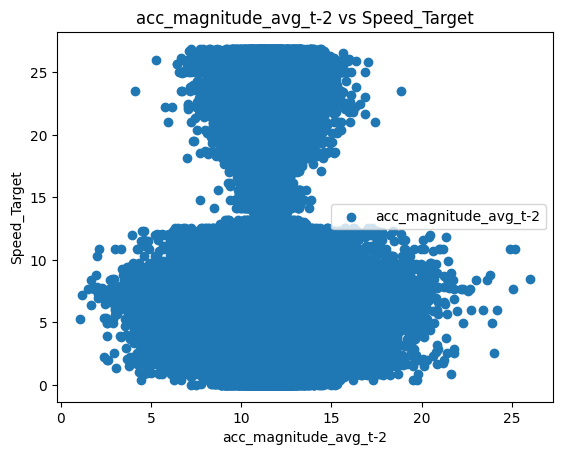

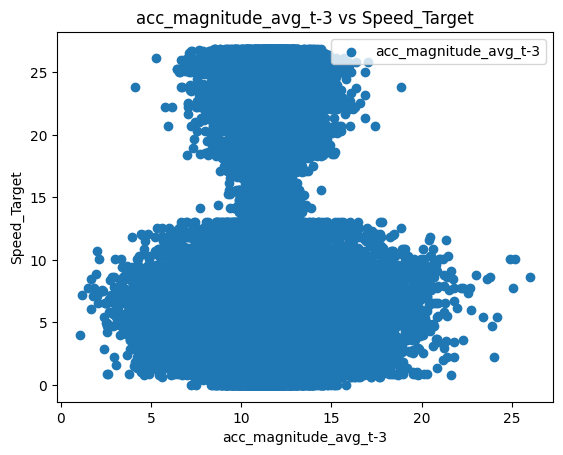

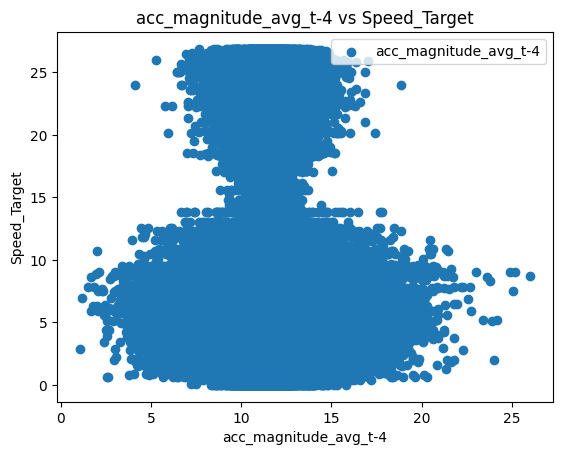

In [156]:
target = 'Speed_Target'

for feature in df_1.columns:
    if feature != target:
        plt.scatter(df_1[feature],df_1[target],label = feature)
        plt.xlabel(feature)
        plt.ylabel(target)
        plt.title(f"{feature} vs {target}")
        plt.legend()
        plt.show()

    

In [157]:
df_3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95201 entries, 8281 to 103481
Data columns (total 88 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   acc_x_dashboard_left           95201 non-null  float64       
 1   acc_y_dashboard_left           95201 non-null  float64       
 2   acc_z_dashboard_left           95201 non-null  float64       
 3   acc_x_above_suspension_left    95201 non-null  float64       
 4   acc_y_above_suspension_left    95201 non-null  float64       
 5   acc_z_above_suspension_left    95201 non-null  float64       
 6   acc_x_below_suspension_left    95201 non-null  float64       
 7   acc_y_below_suspension_left    95201 non-null  float64       
 8   acc_z_below_suspension_left    95201 non-null  float64       
 9   gyro_x_dashboard_left          95201 non-null  float64       
 10  gyro_y_dashboard_left          95201 non-null  float64       
 11  gyro_z_dashboard

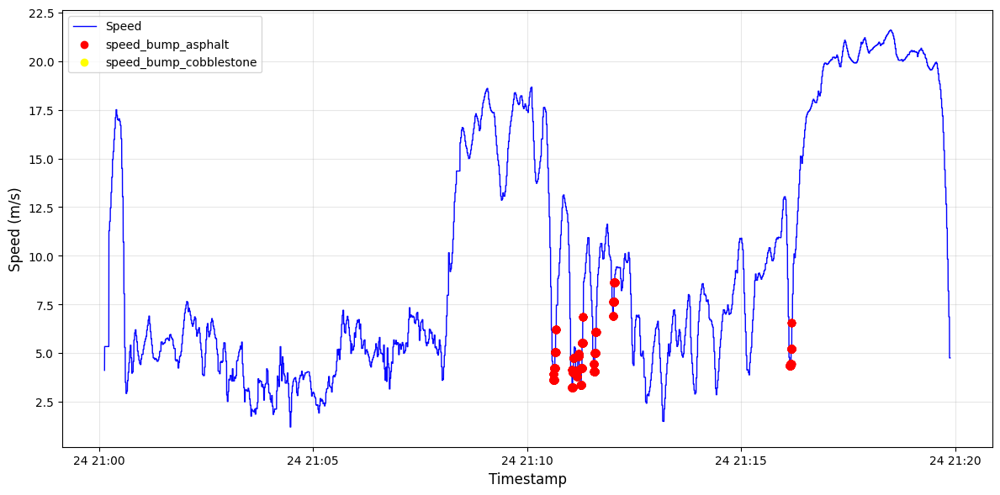

In [158]:
no_speed_bump = df_2[df_2['no_speed_bump'] == 1] 
speed_bump_asphalt = df_2[df_2['speed_bump_asphalt'] == 1] 
speed_bump_cobblestone = df_2[df_2['speed_bump_cobblestone'] == 1] 

plt.figure(figsize=(12, 6))
plt.plot(df_2['timestamp'], df_2['speed'], label='Speed', color='blue', linewidth=1)
plt.scatter(speed_bump_asphalt['timestamp'], speed_bump_asphalt['speed'], 
            color='red', label='speed_bump_asphalt', zorder=5)
plt.scatter(speed_bump_cobblestone['timestamp'], speed_bump_cobblestone['speed'], 
            color='yellow', label='speed_bump_cobblestone', zorder=5)


plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('Speed (m/s)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()


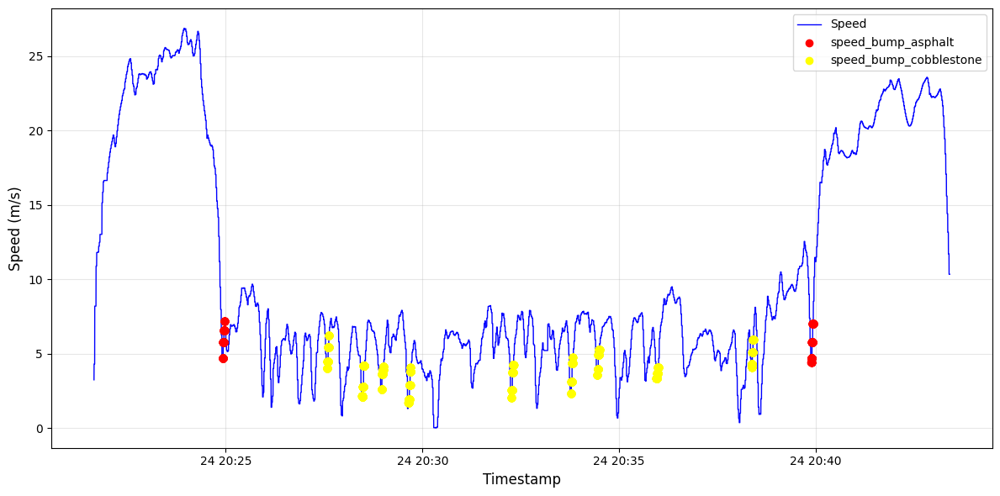

In [159]:
no_speed_bump = df_1[df_1['no_speed_bump'] == 1] 
speed_bump_asphalt = df_1[df_1['speed_bump_asphalt'] == 1] 
speed_bump_cobblestone = df_1[df_1['speed_bump_cobblestone'] == 1] 

plt.figure(figsize=(12, 6))
plt.plot(df_1['timestamp'], df_1['speed'], label='Speed', color='blue', linewidth=1)
plt.scatter(speed_bump_asphalt['timestamp'], speed_bump_asphalt['speed'], 
            color='red', label='speed_bump_asphalt', zorder=5)
plt.scatter(speed_bump_cobblestone['timestamp'], speed_bump_cobblestone['speed'], 
            color='yellow', label='speed_bump_cobblestone', zorder=5)


plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('Speed (m/s)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()


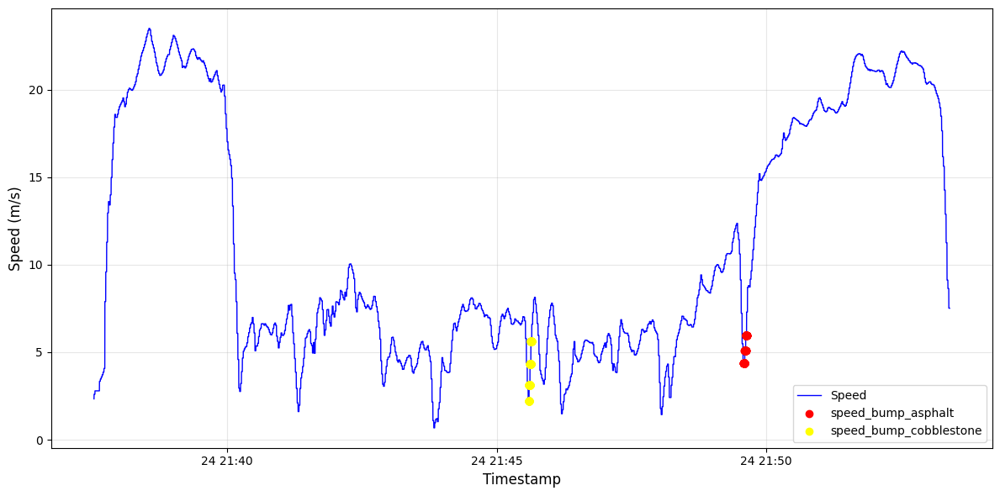

In [160]:
no_speed_bump = df_3[df_3['no_speed_bump'] == 1]                    # Como era de esperarse con topes la velocidad baja
speed_bump_asphalt = df_3[df_3['speed_bump_asphalt'] == 1]          # pero no parece haber diferencia entre el tipo de material del tope
speed_bump_cobblestone = df_3[df_3['speed_bump_cobblestone'] == 1] 

plt.figure(figsize=(12, 6))
plt.plot(df_3['timestamp'], df_3['speed'], label='Speed', color='blue', linewidth=1)
plt.scatter(speed_bump_asphalt['timestamp'], speed_bump_asphalt['speed'], 
            color='red', label='speed_bump_asphalt', zorder=5)
plt.scatter(speed_bump_cobblestone['timestamp'], speed_bump_cobblestone['speed'], 
            color='yellow', label='speed_bump_cobblestone', zorder=5)


plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('Speed (m/s)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()


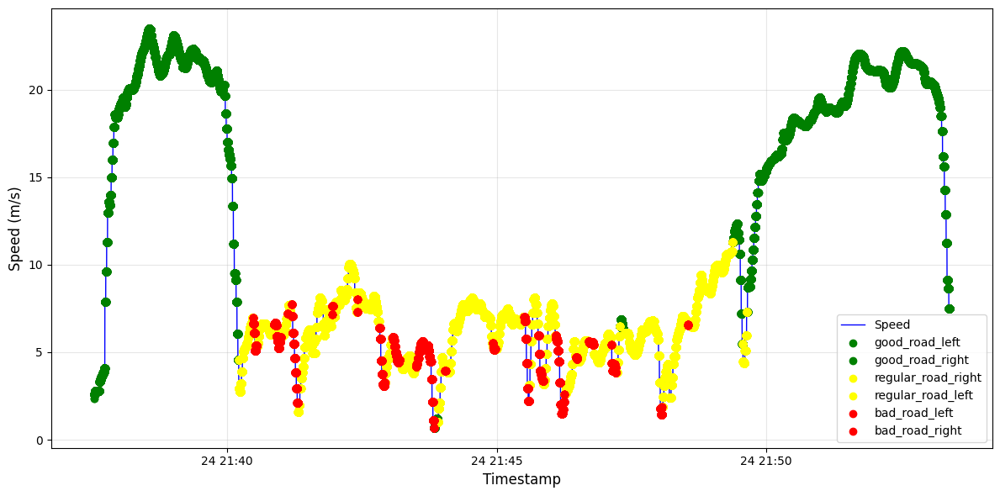

In [161]:
regular_road_right = df_3[df_3['regular_road_right'] == 1] 
regular_road_left = df_3[df_3['regular_road_left'] == 1] 
good_road_left = df_3[df_3['good_road_left'] == 1] 
good_road_right = df_3[df_3['good_road_right'] == 1] 
bad_road_right = df_3[df_3['bad_road_right'] == 1]
bad_road_left = df_3[df_3['bad_road_left'] == 1]

plt.figure(figsize=(12, 6))
plt.plot(df_3['timestamp'], df_3['speed'], label='Speed', color='blue', linewidth=1)
plt.scatter(good_road_left['timestamp'], good_road_left['speed'], 
            color='green', label='good_road_left', zorder=5)
plt.scatter(good_road_right['timestamp'], good_road_right['speed'], 
            color='green', label='good_road_right', zorder=5)
plt.scatter(regular_road_right['timestamp'], regular_road_right['speed'], 
            color='yellow', label='regular_road_right', zorder=5)
plt.scatter(regular_road_left['timestamp'], regular_road_left['speed'], 
            color='yellow', label='regular_road_left', zorder=5)
plt.scatter(bad_road_left['timestamp'], bad_road_left['speed'], 
            color='red', label='bad_road_left', zorder=5)
plt.scatter(bad_road_right['timestamp'], bad_road_right['speed'], 
            color='red', label='bad_road_right', zorder=5)


plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('Speed (m/s)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()

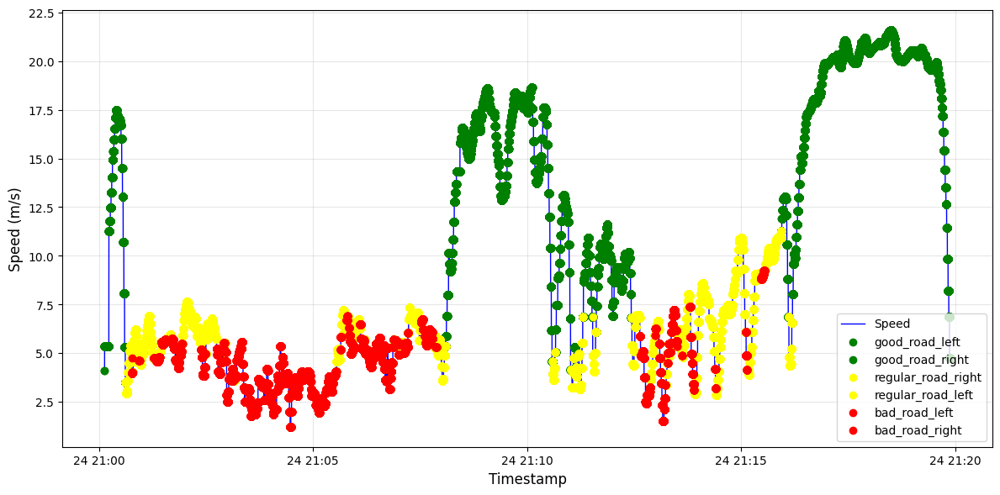

In [162]:
regular_road_right = df_2[df_2['regular_road_right'] == 1] 
regular_road_left = df_2[df_2['regular_road_left'] == 1] 
good_road_left = df_2[df_2['good_road_left'] == 1] 
good_road_right = df_2[df_2['good_road_right'] == 1] 
bad_road_right = df_2[df_2['bad_road_right'] == 1]
bad_road_left = df_2[df_2['bad_road_left'] == 1]

plt.figure(figsize=(12, 6))
plt.plot(df_2['timestamp'], df_2['speed'], label='Speed', color='blue', linewidth=1)
plt.scatter(good_road_left['timestamp'], good_road_left['speed'], 
            color='green', label='good_road_left', zorder=5)
plt.scatter(good_road_right['timestamp'], good_road_right['speed'], 
            color='green', label='good_road_right', zorder=5)
plt.scatter(regular_road_right['timestamp'], regular_road_right['speed'], 
            color='yellow', label='regular_road_right', zorder=5)
plt.scatter(regular_road_left['timestamp'], regular_road_left['speed'], 
            color='yellow', label='regular_road_left', zorder=5)
plt.scatter(bad_road_left['timestamp'], bad_road_left['speed'], 
            color='red', label='bad_road_left', zorder=5)
plt.scatter(bad_road_right['timestamp'], bad_road_right['speed'], 
            color='red', label='bad_road_right', zorder=5)


plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('Speed (m/s)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()

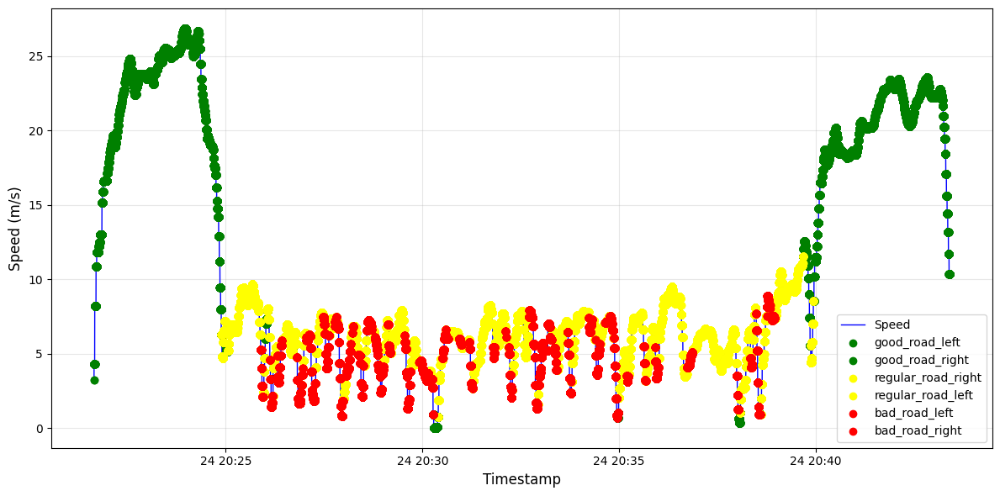

In [163]:
regular_road_right = df_1[df_1['regular_road_right'] == 1] # Despues de las visualizaciones podemos juntar las opciones
regular_road_left = df_1[df_1['regular_road_left'] == 1]   # por lado de god_road, regular_road y bad_road 
good_road_left = df_1[df_1['good_road_left'] == 1] 
good_road_right = df_1[df_1['good_road_right'] == 1] 
bad_road_right = df_1[df_1['bad_road_right'] == 1]
bad_road_left = df_1[df_1['bad_road_left'] == 1]

plt.figure(figsize=(12, 6))
plt.plot(df_1['timestamp'], df_1['speed'], label='Speed', color='blue', linewidth=1)
plt.scatter(good_road_left['timestamp'], good_road_left['speed'], 
            color='green', label='good_road_left', zorder=5)
plt.scatter(good_road_right['timestamp'], good_road_right['speed'], 
            color='green', label='good_road_right', zorder=5)
plt.scatter(regular_road_right['timestamp'], regular_road_right['speed'], 
            color='yellow', label='regular_road_right', zorder=5)
plt.scatter(regular_road_left['timestamp'], regular_road_left['speed'], 
            color='yellow', label='regular_road_left', zorder=5)
plt.scatter(bad_road_left['timestamp'], bad_road_left['speed'], 
            color='red', label='bad_road_left', zorder=5)
plt.scatter(bad_road_right['timestamp'], bad_road_right['speed'], 
            color='red', label='bad_road_right', zorder=5)


plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('Speed (m/s)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()

In [164]:
df_1['good_road'] = df_1[['good_road_left','good_road_right']].max(axis=1)
df_1['regular_road'] = df_1[['regular_road_left','regular_road_right']].max(axis=1)
df_1["bad_road"] = df_1[["bad_road_left", "bad_road_right"]].max(axis=1)
df_2['good_road'] = df_2[['good_road_left','good_road_right']].max(axis=1)
df_2['regular_road'] = df_2[['regular_road_left','regular_road_right']].max(axis=1)
df_2["bad_road"] = df_2[["bad_road_left", "bad_road_right"]].max(axis=1)
df_3['good_road'] = df_3[['good_road_left','good_road_right']].max(axis=1)
df_3['regular_road'] = df_3[['regular_road_left','regular_road_right']].max(axis=1)
df_3["bad_road"] = df_3[["bad_road_left", "bad_road_right"]].max(axis=1)

In [165]:
df_1.drop(columns=["good_road_left", "good_road_right",
                 "regular_road_left", "regular_road_right",
                 "bad_road_left", "bad_road_right"], inplace=True)
df_2.drop(columns=["good_road_left", "good_road_right",
                 "regular_road_left", "regular_road_right",
                 "bad_road_left", "bad_road_right"], inplace=True)
df_3.drop(columns=["good_road_left", "good_road_right",
                 "regular_road_left", "regular_road_right",
                 "bad_road_left", "bad_road_right"], inplace=True)


In [166]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 130501 entries, 10243 to 140743
Data columns (total 85 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   acc_x_dashboard_left           130501 non-null  float64       
 1   acc_y_dashboard_left           130501 non-null  float64       
 2   acc_z_dashboard_left           130501 non-null  float64       
 3   acc_x_above_suspension_left    130501 non-null  float64       
 4   acc_y_above_suspension_left    130501 non-null  float64       
 5   acc_z_above_suspension_left    130501 non-null  float64       
 6   acc_x_below_suspension_left    130501 non-null  float64       
 7   acc_y_below_suspension_left    130501 non-null  float64       
 8   acc_z_below_suspension_left    130501 non-null  float64       
 9   gyro_x_dashboard_left          130501 non-null  float64       
 10  gyro_y_dashboard_left          130501 non-null  float64       
 11  g

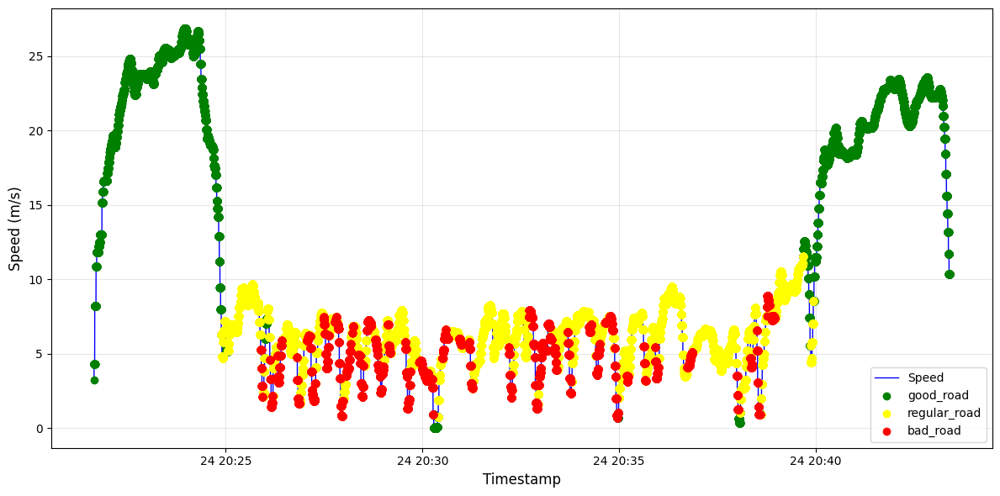

In [167]:
regular_road = df_1[df_1['regular_road'] == 1] 
good_road = df_1[df_1['good_road'] == 1] 
bad_road = df_1[df_1['bad_road'] == 1]

plt.figure(figsize=(12, 6))
plt.plot(df_1['timestamp'], df_1['speed'], label='Speed', color='blue', linewidth=1)
plt.scatter(good_road_left['timestamp'], good_road_left['speed'], 
            color='green', label='good_road', zorder=5)
plt.scatter(regular_road_left['timestamp'], regular_road_left['speed'], 
            color='yellow', label='regular_road', zorder=5)
plt.scatter(bad_road_left['timestamp'], bad_road_left['speed'], 
            color='red', label='bad_road', zorder=5)

plt.xlabel('Timestamp', fontsize=12)
plt.ylabel('Speed (m/s)', fontsize=12)
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()

plt.show()

In [168]:
df_3[df_3['paved_road']==1]

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,gyro_y_avg,gyro_z_avg,gyro_magnitude_avg,acc_magnitude_avg_t-1,acc_magnitude_avg_t-2,acc_magnitude_avg_t-3,acc_magnitude_avg_t-4,good_road,regular_road,bad_road
8281,-0.766145,0.584185,13.577518,0.246603,-0.246603,9.974244,0.100556,-0.328006,9.785102,-0.793457,...,-0.368754,0.549316,0.879736,11.669802,11.422858,11.394689,11.551435,1,0,0
8282,-0.897826,0.979228,14.755465,0.509965,-0.158017,10.323798,0.033519,-0.028730,9.737218,-0.549316,...,0.689189,0.760396,1.226354,11.732349,11.489835,11.613470,11.572774,1,0,0
8283,-0.864307,0.840365,14.420277,0.689530,-0.014365,10.419566,0.040701,0.143652,9.560047,-0.640869,...,0.679016,0.638326,0.935063,11.375485,11.514738,11.577828,11.190447,1,0,0
8284,-0.823605,0.256180,14.714763,0.408211,-0.289698,10.309432,0.004788,0.308852,9.633070,-0.885010,...,0.002543,0.709534,0.748727,11.236911,11.420281,11.220329,11.553266,1,0,0
8285,-1.151611,0.696713,14.089877,0.390853,-0.196325,10.176554,-0.029329,0.305859,9.603741,-0.915527,...,0.269572,0.567118,0.629085,11.284415,11.382235,11.468626,11.480008,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103477,-0.751779,-1.242591,13.591883,0.555455,-1.616086,9.696517,0.603339,-1.213860,8.492233,-1.342773,...,2.380371,-0.091553,2.532474,11.142183,11.236468,11.084578,11.219388,1,0,0
103478,-1.362301,-1.508347,13.874399,0.677559,-1.386243,10.031705,-0.670376,-1.472434,8.322245,-0.183105,...,-1.022339,-0.523885,1.298452,11.493950,11.254312,11.759345,12.291465,1,0,0
103479,-1.355118,-0.222661,14.563929,0.272939,-1.968034,7.405266,-0.596156,-3.524265,8.319851,-1.586914,...,-2.176921,-0.597636,2.463696,11.023920,11.491217,11.567065,11.503020,1,0,0
103480,-1.169568,-1.921347,13.500903,0.902614,-1.810016,8.923190,-0.095768,-1.516727,8.954314,-0.854492,...,-0.864665,-0.559489,1.069232,11.422023,11.542409,11.175456,10.719307,1,0,0


In [169]:
df_3[df_3['cobblestone_road']==1]

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,gyro_y_avg,gyro_z_avg,gyro_magnitude_avg,acc_magnitude_avg_t-1,acc_magnitude_avg_t-2,acc_magnitude_avg_t-3,acc_magnitude_avg_t-4,good_road,regular_road,bad_road
48210,2.774880,3.428497,18.732234,4.836287,0.675165,18.916587,-1.776498,-2.667141,3.217807,-5.279541,...,35.247803,-0.544230,35.491635,8.300357,15.792192,10.452787,11.090733,0,1,0
48211,4.277241,-1.234211,15.629348,3.411737,-1.125275,18.289306,2.061408,8.743624,-1.898602,-5.508423,...,25.822957,-0.953674,25.876893,13.339067,16.808758,9.637962,11.185233,0,1,0
48212,4.412514,1.862689,14.504074,2.881422,-0.542287,14.413094,-1.154005,7.894880,-6.892907,-3.570557,...,23.577372,-5.162557,24.280994,14.443189,14.651316,9.636001,11.964354,0,1,0
48213,2.509123,0.198719,16.503232,2.348712,-0.531513,14.453795,5.370194,5.252878,-1.374272,-5.493164,...,10.932922,-11.754354,17.023463,13.548610,12.005506,11.363721,12.400025,0,1,0
48214,3.912126,0.069432,10.577583,4.752490,3.555389,12.756306,2.252944,-5.901707,2.415749,-6.774902,...,-1.129150,-11.698405,12.738464,12.205830,8.131514,12.936381,11.862165,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79292,-0.663194,3.066972,13.424289,-1.575385,0.663194,8.896853,-4.501099,-6.220136,1.185130,8.117676,...,-6.782532,2.909342,12.196099,9.433442,16.191777,7.599058,14.670267,0,1,0
79293,-0.302867,1.080982,9.612720,0.132878,-1.248576,6.758831,-0.362722,0.628478,2.256535,11.581421,...,-13.903300,3.918966,15.727513,11.350224,10.990392,9.407102,15.465648,0,1,0
79294,-1.364695,-5.753267,9.248801,-2.413355,1.187524,8.087613,0.995988,4.809951,9.299079,-5.340576,...,-2.487183,2.065023,5.670700,11.910902,10.977724,13.438848,16.805368,0,1,0
79295,-1.233014,4.821922,16.261418,1.532289,0.311246,7.611167,2.700659,3.579331,18.416199,6.744385,...,-7.415771,0.045776,7.934106,11.855366,7.619825,15.725868,15.256555,0,1,0


In [170]:
df_3[df_3['asphalt_road']==1] # Podemos ver que paved_road, es la suma de los datos de asphalt_road y coblestone_road
                              # por lo que podemos quitar paved_road

,acc_x_dashboard_left,acc_y_dashboard_left,acc_z_dashboard_left,acc_x_above_suspension_left,acc_y_above_suspension_left,acc_z_above_suspension_left,acc_x_below_suspension_left,acc_y_below_suspension_left,acc_z_below_suspension_left,gyro_x_dashboard_left,...,gyro_y_avg,gyro_z_avg,gyro_magnitude_avg,acc_magnitude_avg_t-1,acc_magnitude_avg_t-2,acc_magnitude_avg_t-3,acc_magnitude_avg_t-4,good_road,regular_road,bad_road
8281,-0.766145,0.584185,13.577518,0.246603,-0.246603,9.974244,0.100556,-0.328006,9.785102,-0.793457,...,-0.368754,0.549316,0.879736,11.669802,11.422858,11.394689,11.551435,1,0,0
8282,-0.897826,0.979228,14.755465,0.509965,-0.158017,10.323798,0.033519,-0.028730,9.737218,-0.549316,...,0.689189,0.760396,1.226354,11.732349,11.489835,11.613470,11.572774,1,0,0
8283,-0.864307,0.840365,14.420277,0.689530,-0.014365,10.419566,0.040701,0.143652,9.560047,-0.640869,...,0.679016,0.638326,0.935063,11.375485,11.514738,11.577828,11.190447,1,0,0
8284,-0.823605,0.256180,14.714763,0.408211,-0.289698,10.309432,0.004788,0.308852,9.633070,-0.885010,...,0.002543,0.709534,0.748727,11.236911,11.420281,11.220329,11.553266,1,0,0
8285,-1.151611,0.696713,14.089877,0.390853,-0.196325,10.176554,-0.029329,0.305859,9.603741,-0.915527,...,0.269572,0.567118,0.629085,11.284415,11.382235,11.468626,11.480008,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103477,-0.751779,-1.242591,13.591883,0.555455,-1.616086,9.696517,0.603339,-1.213860,8.492233,-1.342773,...,2.380371,-0.091553,2.532474,11.142183,11.236468,11.084578,11.219388,1,0,0
103478,-1.362301,-1.508347,13.874399,0.677559,-1.386243,10.031705,-0.670376,-1.472434,8.322245,-0.183105,...,-1.022339,-0.523885,1.298452,11.493950,11.254312,11.759345,12.291465,1,0,0
103479,-1.355118,-0.222661,14.563929,0.272939,-1.968034,7.405266,-0.596156,-3.524265,8.319851,-1.586914,...,-2.176921,-0.597636,2.463696,11.023920,11.491217,11.567065,11.503020,1,0,0
103480,-1.169568,-1.921347,13.500903,0.902614,-1.810016,8.923190,-0.095768,-1.516727,8.954314,-0.854492,...,-0.864665,-0.559489,1.069232,11.422023,11.542409,11.175456,10.719307,1,0,0


In [171]:
df_1.drop(columns = ['paved_road'],inplace = True)
df_2.drop(columns = ['paved_road'],inplace = True)
df_3.drop(columns = ['paved_road'],inplace = True)

In [172]:
df_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 130501 entries, 10243 to 140743
Data columns (total 84 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   acc_x_dashboard_left           130501 non-null  float64       
 1   acc_y_dashboard_left           130501 non-null  float64       
 2   acc_z_dashboard_left           130501 non-null  float64       
 3   acc_x_above_suspension_left    130501 non-null  float64       
 4   acc_y_above_suspension_left    130501 non-null  float64       
 5   acc_z_above_suspension_left    130501 non-null  float64       
 6   acc_x_below_suspension_left    130501 non-null  float64       
 7   acc_y_below_suspension_left    130501 non-null  float64       
 8   acc_z_below_suspension_left    130501 non-null  float64       
 9   gyro_x_dashboard_left          130501 non-null  float64       
 10  gyro_y_dashboard_left          130501 non-null  float64       
 11  g

In [173]:
df_1['speed_bump'] = (df_1["speed_bump_asphalt"] | df_1["speed_bump_cobblestone"]).astype(int)
df_2['speed_bump'] = (df_2["speed_bump_asphalt"] | df_2["speed_bump_cobblestone"]).astype(int)
df_3['speed_bump'] = (df_3["speed_bump_asphalt"] | df_3["speed_bump_cobblestone"]).astype(int)

In [174]:
df_1.drop(columns = ['speed_bump_asphalt','speed_bump_cobblestone'],inplace = True)
df_2.drop(columns = ['speed_bump_asphalt','speed_bump_cobblestone'],inplace = True)
df_3.drop(columns = ['speed_bump_asphalt','speed_bump_cobblestone'],inplace = True)

In [181]:
df_3.isnull().sum().mean()

0.0

In [176]:
df_3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 95201 entries, 8281 to 103481
Data columns (total 83 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   acc_x_dashboard_left           95201 non-null  float64       
 1   acc_y_dashboard_left           95201 non-null  float64       
 2   acc_z_dashboard_left           95201 non-null  float64       
 3   acc_x_above_suspension_left    95201 non-null  float64       
 4   acc_y_above_suspension_left    95201 non-null  float64       
 5   acc_z_above_suspension_left    95201 non-null  float64       
 6   acc_x_below_suspension_left    95201 non-null  float64       
 7   acc_y_below_suspension_left    95201 non-null  float64       
 8   acc_z_below_suspension_left    95201 non-null  float64       
 9   gyro_x_dashboard_left          95201 non-null  float64       
 10  gyro_y_dashboard_left          95201 non-null  float64       
 11  gyro_z_dashboard

In [638]:
m = folium.Map(location=[df_1['latitude'].mean(), df_1['longitude'].mean()], zoom_start=12)

color_map = {
    0: 'red',  # bad_road
    1: 'orange',  # regular_road
    2: 'green'  # good_road
}

# Añadir los puntos al mapa, coloreando según la condición de la carretera
for _, row in df_1.iterrows():
    color = 'gray'  # Por defecto en caso de no encontrar condición
    if row['good_road'] == 1:
        color = color_map[2]  # Good road
    elif row['regular_road'] == 1:
        color = color_map[1]  # Regular road
    elif row['bad_road'] == 1:
        color = color_map[0]  # Bad road
    
    # Añadir un marcador en cada punto con la condición de la carretera
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=3,  # Tamaño del marcador
        color=color,
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

# Mostrar el mapa
m.save('ruta_mapa_df_1.html')

In [639]:
m = folium.Map(location=[df_2['latitude'].mean(), df_2['longitude'].mean()], zoom_start=12)

color_map = {
    0: 'red',  # bad_road
    1: 'orange',  # regular_road
    2: 'green'  # good_road
}

# Añadir los puntos al mapa, coloreando según la condición de la carretera
for _, row in df_2.iterrows():
    color = 'gray'  # Por defecto en caso de no encontrar condición
    if row['good_road'] == 1:
        color = color_map[2]  # Good road
    elif row['regular_road'] == 1:
        color = color_map[1]  # Regular road
    elif row['bad_road'] == 1:
        color = color_map[0]  # Bad road
    
    # Añadir un marcador en cada punto con la condición de la carretera
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=3,  # Tamaño del marcador
        color=color,
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

# Mostrar el mapa
m.save('ruta_mapa_df_2.html')

In [640]:
m = folium.Map(location=[df_3['latitude'].mean(), df_3['longitude'].mean()], zoom_start=12)

color_map = {
    0: 'red',  # bad_road
    1: 'orange',  # regular_road
    2: 'green'  # good_road
}

# Añadir los puntos al mapa, coloreando según la condición de la carretera
for _, row in df_3.iterrows():
    color = 'gray'  # Por defecto en caso de no encontrar condición
    if row['good_road'] == 1:
        color = color_map[2]  # Good road
    elif row['regular_road'] == 1:
        color = color_map[1]  # Regular road
    elif row['bad_road'] == 1:
        color = color_map[0]  # Bad road
    
    # Añadir un marcador en cada punto con la condición de la carretera
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=3,  # Tamaño del marcador
        color=color,
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

# Mostrar el mapa
m.save('ruta_mapa_df_3.html')

In [177]:
df_1.to_csv('df_1.csv',index = False)
df_2.to_csv('df_2.csv',index = False)
df_3.to_csv('df_3.csv',index = False)